# Libraries


In [1881]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import datetime
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import nltk
import spacy
from nltk.corpus import stopwords
import re
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.experimental import enable_iterative_imputer
import statsmodels.api as sm
import shap 
import missingno as msno
from datetime import datetime
import pandas as pd
from dateutil.relativedelta import relativedelta
import pandas as pd
import spacy
from geopy.geocoders import Nominatim
import folium
from math import ceil

#msno 
import missingno as msno
#import vif
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
#display all columns 
from IPython.display import display
pd.set_option('display.max_columns', None)
from IPython.display import IFrame
from sklearn.impute import IterativeImputer
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from scipy.stats import yeojohnson
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

#import breusch pagan test
from statsmodels.stats.diagnostic import het_breuschpagan


from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

from sklearn.preprocessing import power_transform
import pandas as pd
#imoprt boostregressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.dummy import DummyRegressor
import numpy as np
import matplotlib.pyplot as plt



import statsmodels.formula.api as smf
import warnings

# Table of Contents

    1. Introduction

    2.  Dataset preparation

    3. Exploratory Data Analysis, feature engineering & further data cleaning

    4. Natural language processing (see folder local LLM for process)

    5. Latent Dirichlet allocation (see folder topic modelling for process)

    6. Correlation, imputation & VIF
    
        6.1 Correlation Analysis

            6.1.1 Correlation Analysis between the continuous feature variables
            6.1.2 Correlation Analysis between the nominal categorical variables

        6.2 Imputation
    
        6.3 Computing VIF & Feature Selection

        6.4 Mediation

        6.5 Linearity check

    7. Scaling & Test/Train Split

    8. Regression analysis

        8.1 Univariate

        8.2 Multiple linear regression

        8.3 Assumption testing

        8.4 MLR CV on testset
    
    9. Extreme gradient boosting

        9.1 XGB model 1 (incl. hyperparameter tuning)

        8.2 XGB model 2 (incl. hyperparameter tuning) and class instance for reproducibility
    
    9. Conclusion




# 1. Introduction

In this project, our aim is to implement a number of machine learning models to answer  our research question on the AI Tools  dataset.

- Research Question: How do the determinants in the resources based view of the firm influence AI tools sales?

During this theis project we consolidate the knowledge by building a variety of machine learning models independently.

# Prelimenary Data Exploration

A lot of data has been gathered with a lot of features. For the research the features that will be analyzed will be selected.

In [1882]:
# Loading main datasets
file_path1 = '/Users/macbook/thesis/new/code/data/processed_data/final.csv'
file_path2 = '/Users/macbook/thesis/new/code/data/processed_data/reviews_data.csv'

gen = pd.read_csv(file_path1)
rev = pd.read_csv(file_path2)


Columns (13,18,21) have mixed types. Specify dtype option on import or set low_memory=False.


In [1883]:
#merge two datasets on tool_id
df_fin = pd.merge(gen, rev, on='tool_id', how='left')

In [1884]:
#sparsity level measure
def sparsity_level(gen):
    sparsity = []
    for col in gen.columns:
        miss = gen[col].isnull().sum()
        sparsity.append((miss/len(gen[col]))*100)
    return pd.DataFrame({'column_name':gen.columns,'sparsity':sparsity})

print(sparsity_level(gen))

#save to csv
sparsity_level(gen).to_excel('/Users/macbook/thesis/new/code/data/raw_data/sparsity.xlsx')

                column_name   sparsity
0                   tool_id   0.000000
1                url_format   0.009462
2                   unknown  37.326142
3                       jan  37.326142
4                       feb  37.326142
..                      ...        ...
64                 use case  92.705081
65  type of output modality  93.093008
66      type of data origin  92.761851
67                 freemium  95.959883
68        fuzzy_match_score  92.705081

[69 rows x 2 columns]


In [1885]:
print(df_fin.columns)

Index(['tool_id', 'url_format_x', 'unknown', 'jan', 'feb', 'mar', 'apr', 'may',
       'jun', 'jul', 'aug', 'sep', 'average visits',
       'last month with visitors', 'name', 'task', 'url', 'price', 'saves',
       'likes', 'stars', 'period', 'url_content', 'name_format',
       'organization_name', 'organization_name_url', 'industries',
       'headquarters_location', 'description', 'cb_rank_(company)',
       'headquarters_regions', 'founded_date', 'founded_date_precision',
       'operating_status', 'company_type', 'website', 'linkedin',
       'full_description', 'industry_groups', 'number_of_employees',
       'number_of_founders', 'number_of_funding_rounds', 'last_funding_date',
       'last_funding_amount', 'last_funding_amount_currency',
       'last_funding_amount_currency_(in_usd)', 'total_funding_amount',
       'total_funding_amount_currency',
       'total_funding_amount_currency_(in_usd)', 'number_of_investors',
       'number_of_acquisitions', 'ipo_status', 'ipo_date', 

In [1886]:
print(rev.shape)
print(gen.shape)
print(df_fin.shape)

(50705, 14)
(10569, 69)
(50359, 82)


In [1887]:
df_fin.drop_duplicates(subset=['tool_id'], inplace=True)
print(df_fin.shape)


(10569, 82)


# 2. Data pre processing 

When combining the literature research with the data, the following columns are selected for the final analysis.

The dataset is very sparse because it is made out of 4 different sources. We will impute the dataset according to a couple of cases and will determine based on MCAR, domain knowledge.

In this research every variable will be treated according to its meaning. If we choose for a List-Wise Deletion, so deleting rows that will contain NaNs, the analysis will be biased. In this section, we will first try to understand the missing values and determine a plan de campagne to treat the missing values.

Step 1 was the just selecting the rows which contains the target variable, because we do not want the impute or adapt our target variable. 

Step 2 is checking visualizing the missing data. 

In [1888]:
#drop all tools that have no average visits as it the target variable
df_fin = df_fin.dropna(subset=['average visits'], how='all')

In [1889]:
relevant_columns2 = [ 'tool_id', 'company_type', 'average visits', 'task', 'price', 'saves', 'likes', 'ipo_status', 'description',
                    'stars', 'period',   'headquarters_location', 'founded_date','headquarters_regions', 'number_of_employees', 'number_of_founders', 'description', 'full_description',
                    'number_of_funding_rounds', 'freemium', 'total_funding_amount', 'number_of_investors', 'review_text', 'helpful_count', 'all_time_score', 'review_id', 'amount_of_reviews', 'recent_review_score', 'recent_reviews_amount']

#drop duplciates of df and form new df
df3 = df_fin.drop_duplicates(subset=['tool_id'], keep='first')

# Maak een nieuwe DataFrame met alleen de relevante kolommen
df = df3.filter(relevant_columns2, axis=1)

In [1890]:
df.shape

(6624, 28)

In [1891]:
# Code retrieved from ChatGPT (2024)


# making a list of missing value types
df_summary_list = []

# Loop through each column and calculate the mean (if applicable), count, and sparsity.
for column in df.columns:
    data_dict = {'Column': column, 'Dtype': str(df[column].dtype)}
    
    # Calculate sparsity for all columns.
    data_dict['Sparsity (%)'] = "{:.2f}".format((df[column].isnull().sum() / len(df[column])) * 100)
    
    # Calculate mean if the column is numeric.
    if df[column].dtype in ['int64', 'float64']:
        # Format the mean with two decimal places and comma as thousand separator.
        data_dict['Mean'] = "{:,.2f}".format(df[column].mean())
    else:
        data_dict['Mean'] = None  # Non-numeric columns get a None value.
    
    # Calculate count of non-null values.
    data_dict['Count'] = df[column].count()
    
    # Append the dictionary to the list.
    df_summary_list.append(data_dict)

# Create the summary DataFrame from the list of dictionaries.
df_summary = pd.DataFrame(df_summary_list)

#save to excel
#df_summary.to_excel('/Users/macbook/thesis/new/code/data/raw_data/df3_summary.xlsx')

# Display the DataFrame.
df_summary

,Column,Dtype,Sparsity (%),Mean,Count
0,tool_id,float64,0.00,"4,804.39",6624
1,company_type,object,76.15,None,1580
2,average visits,float64,0.00,"6,847,696.57",6624
3,task,object,8.57,None,6056
4,price,object,8.57,None,6056
5,saves,object,13.41,None,5736
6,likes,float64,87.21,2.45,847
7,ipo_status,object,76.00,None,1590
8,description,object,76.00,None,1590
9,stars,float64,79.42,3.82,1363


#### Checking missing values


<Axes: >

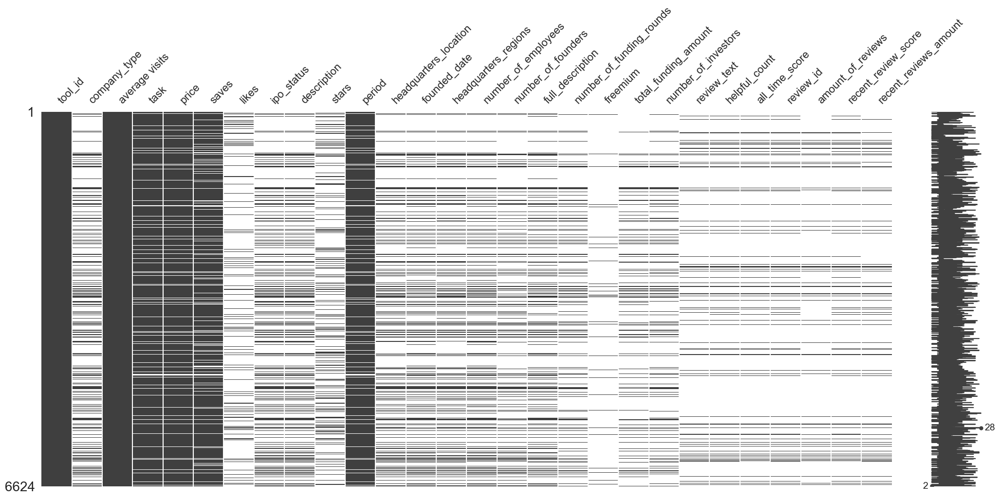

In [1892]:
# Matrix plot to visualize missing data
msno.matrix(df)

As we can clearly see in above visualizations is:

The Matrix: average visits, task , price, period and saves are quite filled. Second grade is the ipo_status, company type and description. Third grade are the rest of the variables.

The Heatmap: this map shows the correlation between missingness of variables. Which says something about the Missingness Completely at Random (MCAR) (Robin, 1987). We can clearly see that the missingness of variables correlates with the dataset they come from. So most of them are not MCAR. We will impute based on this info. But we first we change datatypes so we have more numerical values for this analysis.

<Axes: >

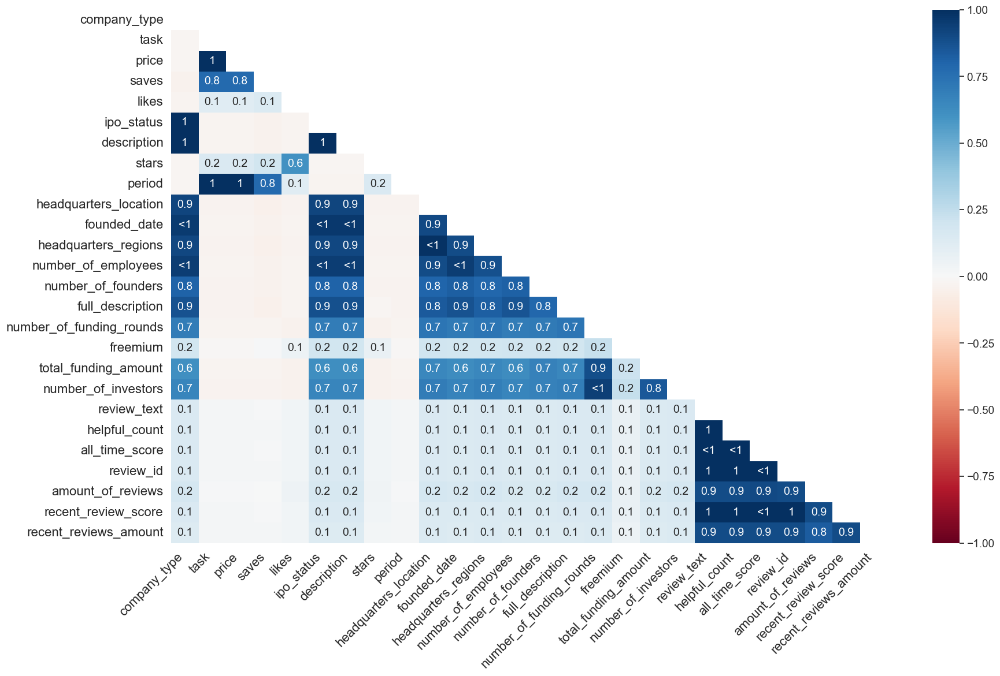

In [1893]:
# Heatmap to visualize correlation of missingness between different columns
msno.heatmap(df)

### Changing datatypes

In [1894]:
df.dtypes

tool_id                     float64
company_type                 object
average visits              float64
task                         object
price                        object
saves                        object
likes                       float64
ipo_status                   object
description                  object
stars                       float64
period                       object
headquarters_location        object
founded_date                 object
headquarters_regions         object
number_of_employees          object
number_of_founders          float64
full_description             object
number_of_funding_rounds    float64
freemium                     object
total_funding_amount        float64
number_of_investors         float64
review_text                  object
helpful_count               float64
all_time_score              float64
review_id                    object
amount_of_reviews           float64
recent_review_score         float64
recent_reviews_amount       

In [1895]:
#df3 = df

In [1896]:
#change tool id to int
df['tool_id'] = df['tool_id'].astype(int)

# change the type of the columns to the right type but skip nan values
df['stars'] = pd.to_numeric(df['stars'], errors='coerce')
df['period'] = df['period'].astype('string')
#change saves , to . in order to change to int
#df['saves'] = df['saves'].str.replace(',', '.')
df['saves'] = pd.to_numeric(df['saves'], errors='coerce')

df['number_of_employees'] = df['number_of_employees'].astype('category')
df['number_of_founders'] = pd.to_numeric(df['number_of_founders'], errors='coerce')
df['number_of_funding_rounds'] = pd.to_numeric(df['number_of_funding_rounds'], errors='coerce')
df['number_of_investors'] = pd.to_numeric(df['number_of_investors'], errors='coerce')
#df['number_of_acquisitions'] = pd.to_numeric(df['number_of_acquisitions'], errors='coerce')

df['total_funding_amount'] = pd.to_numeric(df['total_funding_amount'], errors='coerce')
df['company_type'] = df['company_type'].astype('category', errors='ignore')

df['ipo_status'] = df['ipo_status'].astype('category', errors='ignore')
df['founded_date'] = pd.to_datetime(df['founded_date'])
#df['name_format'] = df['name_format'].astype('string')
df['task'] = df['task'].astype('string')

df['headquarters_location'] = df['headquarters_location'].astype('string')
df['headquarters_regions'] = df['headquarters_regions'].astype('string')
df['description'] = df['description'].astype('string')
df['full_description'] = df['full_description'].astype('string')

#review text
df['review_text'] = df['review_text'].astype('string')

#review id to string
df['review_id'] = df['review_id'].astype('string')

#twijfel
#df['use case'] = df['use case'].astype('string')
df['freemium'] = df['freemium'].astype('category')
#df['last_funding_date'] = pd.to_datetime(df['last_funding_date'])

In [1897]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'task', 'price', 'saves',
       'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount'],
      dtype='object')

In [1898]:
#save to csv
#df.to_csv('/Users/macbook/thesis/new/code/data/processed_data/op.csv')

Now that we have changed datatypes we will check the Chi2 for every variable according to: YASSIR AREZKI (2019)

https://www.kaggle.com/code/yassirarezki/handling-missing-data-mcar-mar-and-mnar-part-i

In [1899]:
#save df to csv
df.to_csv('/Users/macbook/thesis/new/code/data/processed_data/df.csv')

## testing signifance without imputing

In [1900]:
from scipy.stats import chi2_contingency

In [1901]:
import pandas as pd

def test_missingness_independence(dataframe, col1, col2):
    # Create contingency table for missingness between col1 and col2
    contingency_table = pd.crosstab(dataframe[col1].isnull(), dataframe[col2].isnull())
    
    # Perform Chi-Square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    # Return the p-value
    return p

# Identify numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Initialize a DataFrame for the grid
dependency_grid = pd.DataFrame(index=numerical_columns, columns=numerical_columns)

# Perform the Chi-Square tests and populate the grid
for col1 in numerical_columns:
    for col2 in numerical_columns:
        if col1 != col2:
            p_value = test_missingness_independence(df, col1, col2)
            dependency_grid.at[col1, col2] = 'Yes' if p_value < 0.05 else 'No'
        else:
            dependency_grid.at[col1, col2] = 'N/A'  # For diagonal entries

#give yes color red, no color blue and na color white
# Display the grid with colored cells
dependency_grid.style.background_gradient(cmap='coolwarm')

# Display the grid
(dependency_grid)


,tool_id,average visits,saves,likes,stars,number_of_founders,number_of_funding_rounds,total_funding_amount,number_of_investors,helpful_count,all_time_score,amount_of_reviews,recent_review_score,recent_reviews_amount
tool_id,N/A,No,No,No,No,No,No,No,No,No,No,No,No,No
average visits,No,N/A,No,No,No,No,No,No,No,No,No,No,No,No
saves,No,No,N/A,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,No,No
likes,No,No,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
stars,No,No,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
number_of_founders,No,No,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
number_of_funding_rounds,No,No,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes,Yes
total_funding_amount,No,No,Yes,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes,Yes
number_of_investors,No,No,Yes,Yes,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes,Yes
helpful_count,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,N/A,Yes,Yes,Yes,Yes


## Imputing the data

This section is important. Every variable will receive a special treatment, it's form will be based on domain knowledge:

Case 1: Missing because it's logically absent --> replace NaN with zero

Case 2: Acceptable defaults or categorical flagging --> replace NaN with category

Case 3: Missing at random --> Simple imputer (mean)

Case 4: Missing not at random but it is correlating with similar variables (founders, employees, e.d.) --> KNN imputer

Case 5: Missing not at random but it is not correlating with similar categories --> MICE (Multivariate Imputer by Chained Equations)

IMPORTANT NOTE: if features are not yet numerical, they will be imputed in a later stage according to the cases.

In [1902]:
df.columns

Index(['tool_id', 'company_type', 'average visits', 'task', 'price', 'saves',
       'likes', 'ipo_status', 'description', 'stars', 'period',
       'headquarters_location', 'founded_date', 'headquarters_regions',
       'number_of_employees', 'number_of_founders', 'full_description',
       'number_of_funding_rounds', 'freemium', 'total_funding_amount',
       'number_of_investors', 'review_text', 'helpful_count', 'all_time_score',
       'review_id', 'amount_of_reviews', 'recent_review_score',
       'recent_reviews_amount'],
      dtype='object')

Case 1: Missing because it's logically absent

- number_of_founders: If a company has no founders listed, it might be because it's a sole proprietorship or the information is not available.
- number_of_funding_rounds: If no funding rounds are listed, it could imply the company hasn't gone through any.
- number_of_investors: If this is missing, it might mean there are no investors.
- total_funding_amount: If this is zero or missing, it could imply the company hasn't raised any funds.
- amount_of_reviews: No reviews could mean it's a new or less-known product.
- recent_reviews_amount: Similar to amount_of_reviews.

Case 2: Acceptable defaults or categorical flagging

- ipo_status: If missing, you could categorize as 'Not Public' or similar.
- company_type: Could default to a common type if missing, or a category like 'Unknown'.
- freemium: If missing, you could assume 'No' if most companies are not freemium, or create a separate category.
- helpful_count: is part of the review

Case 3: Missing at random

- likes: User engagement metrics like likes could be missing at random.
- stars: Ratings could be missing randomly if not all users rate the company or product.

Case 4: Missing not at random but correlating with similar variables

- saves: If this is a metric that tends to be reported alongside likes or reviews, and it's missing, it might not be at random and could be related to - user engagement metrics.

Case 5: Missing not at random but not correlating with similar categories

- price: The missing price could depend on various factors not necessarily related to other variables.
- description: Missing descriptions could be due to various non-random reasons not reflected in other variables.
- all_time_score: If this is a cumulative metric, its absence could be related to the history or activity of the company, not necessarily linked to other single-time variables.


In [1903]:
# Case 1: Replace NaN with zero for features where missingness implies absence
for column in ['total_funding_amount', 'number_of_funding_rounds' , 'number_of_investors',  'recent_reviews_amount','amount_of_reviews']:  # replace with actual column names
    df[column].fillna(0, inplace=True)


In [1904]:
# Case 3: Apply SimpleImputer for features missing at random
simple_imp = SimpleImputer(strategy='mean')
features_case_3 = ['likes', 'stars'] 
df[features_case_3] = simple_imp.fit_transform(df[features_case_3])

In [1905]:
#count amount of review text filled
df['review_text'].notnull().sum()

747

### Normalizing data

In [1906]:
# Normalize text data in all applicable columns
text_columns = [ 'price',  'headquarters_location', 
                'headquarters_regions', 'task']

for col in text_columns:
    df[col] = df[col].fillna('not specified').str.lower().replace('[^a-z0-9 ]', '', regex=True)


# 3. EDA, Data cleaning and Feature engineering
There are cases when these three processes are done in tandem. This is such a case.

We will go through each of the featuers seperataly. When features are engineered they are labeled green.


### Distribution analysis

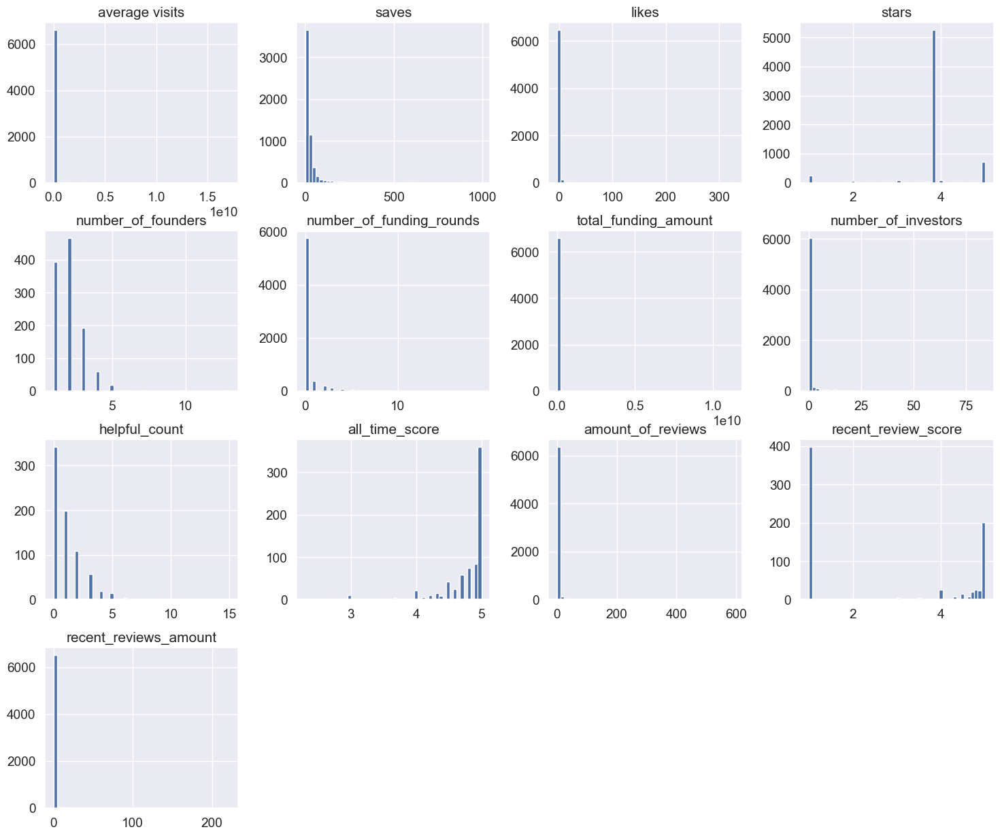

In [1907]:
# List of all columns
all_columns = df.columns.tolist()

# Columns to exclude
exclude_columns = ['tool_id', 'founded_date', 'months_since_period', 'months_since_founded', 'number_of_employees_imputed', 'Topic_1', 'Topic_2', 'Topic_3']

# Create a new list of columns to include by excluding the specified columns
selected_columns = [col for col in all_columns if col not in exclude_columns]

# Plotting for distribution analysis for selected features
df[selected_columns].hist(bins=50, figsize=(18,15))
plt.show()

None of the numerical valeus at this stage are normally distributed

*Basic stats on the EDA*

In [1908]:
# Getting some basic statistics
averagevisits_10000000 = len(df[df['average visits'] > 10000000])
print('Number of average visits', averagevisits_10000000)
claim_20000000 = len(df[df['average visits'] > 20000000])
print('Number of average visits is', claim_20000000)

saves_40= len(df[df['saves'] > 40])
print('Tools that have higher than 40 saves:', saves_40)

fund = len(df[df['total_funding_amount'] > 100000])
print('funding above 100000:', fund)
fund2 = len(df[df['total_funding_amount'] > 1000000])
print('funding above 1000000:', fund2)
fund3 = len(df[df['total_funding_amount'] < 100000])
print('funding beneath 100000:', fund3)

Number of average visits 95
Number of average visits is 73
Tools that have higher than 40 saves: 909
funding above 100000: 681
funding above 1000000: 512
funding beneath 100000: 5938


In [1909]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6624 entries, 0 to 31138
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   tool_id                   6624 non-null   int64         
 1   company_type              1580 non-null   category      
 2   average visits            6624 non-null   float64       
 3   task                      6624 non-null   string        
 4   price                     6624 non-null   object        
 5   saves                     5719 non-null   float64       
 6   likes                     6624 non-null   float64       
 7   ipo_status                1590 non-null   category      
 8   description               1590 non-null   string        
 9   stars                     6624 non-null   float64       
 10  period                    6056 non-null   string        
 11  headquarters_location     6624 non-null   string        
 12  founded_date            

In [1910]:
df.describe()

,tool_id,average visits,saves,likes,stars,founded_date,number_of_founders,number_of_funding_rounds,total_funding_amount,number_of_investors,helpful_count,all_time_score,amount_of_reviews,recent_review_score,recent_reviews_amount
count,6624.000000,6.624000e+03,5719.000000,6624.00000,6624.000000,1497,1138.000000,6624.000000,6.624000e+03,6624.000000,748.000000,739.000000,6624.000000,746.000000,6624.000000
mean,4804.389946,6.847697e+06,29.498863,2.44510,3.815774,2018-11-08 15:53:15.991984128,2.018453,0.337107,1.163580e+07,0.833333,1.078877,4.754398,2.030344,2.741287,0.457880
min,3.000000,0.000000e+00,1.000000,-4.00000,1.000000,1911-01-01 00:00:00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,2.300000,0.000000,1.000000,0.000000
25%,2376.500000,7.110000e+02,6.000000,2.44510,3.815774,2018-01-01 00:00:00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,4.700000,0.000000,1.000000,0.000000
50%,4798.500000,4.695000e+03,14.000000,2.44510,3.815774,2020-04-09 00:00:00,2.000000,0.000000,0.000000e+00,0.000000,1.000000,4.900000,0.000000,1.000000,0.000000
75%,7223.250000,2.873600e+04,29.000000,2.44510,3.815774,2022-01-01 00:00:00,2.000000,0.000000,0.000000e+00,0.000000,2.000000,5.000000,0.000000,5.000000,0.000000
max,9434.000000,1.712668e+10,994.000000,326.00000,5.000000,2023-10-18 00:00:00,13.000000,19.000000,1.130012e+10,84.000000,15.000000,5.000000,590.000000,5.000000,222.000000
std,2789.265243,2.331856e+08,59.786105,4.16972,0.705115,NaN,1.071175,1.184621,2.174757e+08,3.690748,1.473708,0.424572,16.069149,1.896188,5.824374


## Changing the features

####  <span style="color:green;font-weight:bold;">Feature 1: Age of company</span>


In [1911]:
#code retrieved from ChatGPT (2024)

#changing to numerical
def convert_to_months(period):
    current_date = datetime(2024, 1, 1)
    months = {'january': 1, 'february': 2, 'march': 3, 'april': 4, 'may': 5, 'june': 6, 
              'july': 7, 'august': 8, 'september': 9, 'october': 10, 'november': 11, 'december': 12}
    
    if isinstance(period, float) or not isinstance(period, str):
        return None
    
    if period.lower() in months:
        month_num = months[period.lower()]
        year_of_period = current_date.year if month_num <= current_date.month else current_date.year - 1
        return (current_date.year - year_of_period) * 12 + (current_date.month - month_num)
    elif period.isdigit():
        return (current_date.year - int(period)) * 12
    else:
        return None

# Apply the function to your DataFrame
df['months_since_period'] = df['period'].apply(convert_to_months)


In [1912]:
print(df['months_since_period'].value_counts())

months_since_period
10.0    812
9.0     684
8.0     663
24.0    572
7.0     549
5.0     452
0.0     431
6.0     429
11.0    364
1.0     269
4.0     237
36.0    189
2.0     182
48.0     94
3.0      56
60.0     37
84.0     18
72.0     12
96.0      6
Name: count, dtype: int64


In [1913]:
# code retrieved from ChatGPT (2024)

# Current date
current_date = pd.Timestamp.now().normalize()

# function to calculate months since founded
def calculate_months_since_founded(row):
    if pd.notnull(row):
        difference = relativedelta(current_date, row)
        return difference.years * 12 + difference.months
    return None

df['months_since_founded'] = df['founded_date'].apply(calculate_months_since_founded)

# dispaly DataFrame
print(df[['founded_date', 'months_since_founded']].head())


   founded_date  months_since_founded
0           NaT                   NaN
1           NaT                   NaN
2           NaT                   NaN
3    2005-06-01                 224.0
22          NaT                   NaN


In [1914]:
df['merged_months'] = df[['months_since_period', 'months_since_founded']].mean(axis=1)
#df['merged_months'] = df['merged_months'].fillna(0).astype('int64')
print(df['merged_months'].sample())

30524    36.0
Name: merged_months, dtype: float64


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


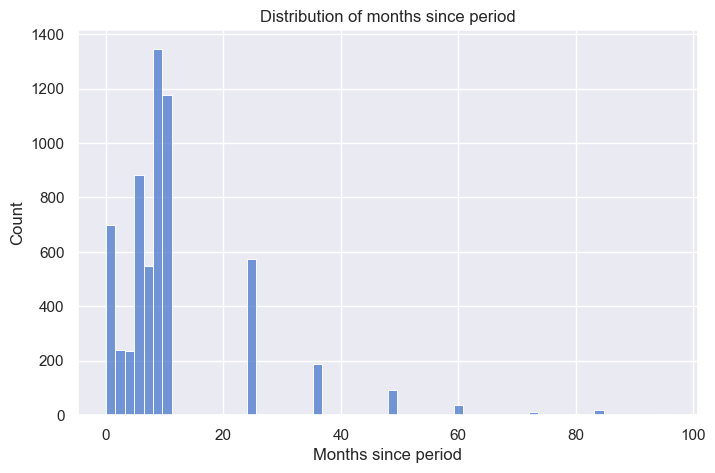

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


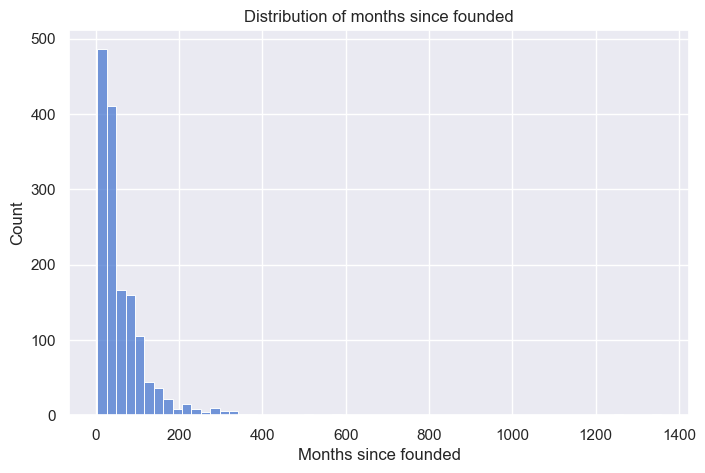

In [1915]:
# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='months_since_period', bins=60)
plt.title('Distribution of months since period')
plt.xlabel('Months since period')
plt.ylabel('Count')
plt.show()

# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='months_since_founded', bins=60)
plt.title('Distribution of months since founded')
plt.xlabel('Months since founded')
plt.ylabel('Count')
plt.show()



use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


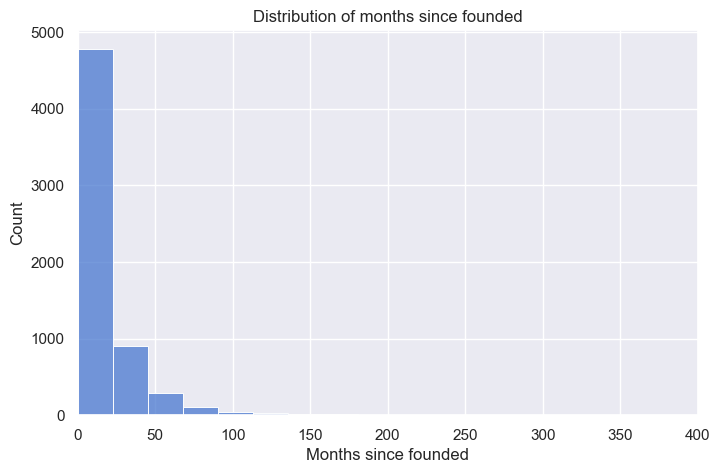

0.6038647342995169
52.264492753623195


In [1916]:
# Plot the distribution of the months since period below 60 months with sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='merged_months', bins=60)
plt.title('Distribution of months since founded')
plt.xlabel('Months since founded')
plt.ylabel('Count')

# Set the x-axis limits to remove outliers
plt.xlim(0, 400)

plt.show()

#percentage of tools older than 150 months
print(len(df[df['merged_months'] > 150])/len(df)*100)
print(len(df[df['merged_months'] < 10])/len(df)*100)


In [1917]:
#delete all companies older than 120 months
df = df[df['merged_months'] < 120]


####  <span style="color:green;font-weight:bold;">Feature 2: Price</span>


In [1918]:
#sample freemium category
df['freemium'].value_counts()

freemium
Yes    142
No      47
Name: count, dtype: int64

In [1919]:
#code retrieved from ChatGPT (2024)

# Convert the 'price' column to lowercase and remove special characters
df['price'] = df['price'].str.lower().str.replace(r'[^a-z0-9\s]', '', regex=True)

# Update the 'freemium' column based on the 'price' column
# If 'price' contains 'free', set 'freemium' to 'Yes', unless it's already 'Yes'
condition_free = df['price'].str.contains('free') & (df['freemium'] != 'Yes')
df.loc[condition_free, 'freemium'] = 'Yes'

# Replace non-specific pricing indications with NaN
non_specific_pricing = ['not specified', 'no pricing', 'contact developers']
for non_specific in non_specific_pricing:
    df['price'] = df['price'].replace(non_specific, np.NaN)

# Fill NaN values in 'price' column with a specific value
df['price'] = df['price'].fillna('NaN')

# Extract and keep only the numeric part from 'price' values that contain 'from'
condition_from = df['price'].str.contains('from')
df.loc[condition_from, 'price'] = df.loc[condition_from, 'price'].str.extract(r'from (\d+)')[0]

# Now change all rows that do not contain only a number to NaN
df['price'] = df['price'].replace(r'[^0-9]+', np.NaN, regex=True)

# Optionally, convert the 'price' column to a numeric dtype
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Print value counts for the 'price' column
print(df['price'].value_counts())

price
19.0     137
10.0     133
29.0     122
5.0      122
9.0      109
        ... 
76.0       1
34.0       1
31.0       1
980.0      1
259.0      1
Name: count, Length: 229, dtype: int64


In [1920]:
#df freemium count
df['freemium'].value_counts()

freemium
Yes    1782
No       39
Name: count, dtype: int64

In [1921]:
#price info
df['price'].value_counts()


price
19.0     137
10.0     133
29.0     122
5.0      122
9.0      109
        ... 
76.0       1
34.0       1
31.0       1
980.0      1
259.0      1
Name: count, Length: 229, dtype: int64

In [1922]:
df.shape

(6134, 31)

In [1923]:
# Convert 'price' to a numeric type, coercing errors to NaN (necessary if any non-numeric strings remain)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# price null fill with mean
df['price'] = df['price'].fillna(df['price'].mean())

#delete price outliers above 10000
df = df[df['price'] < 10000]


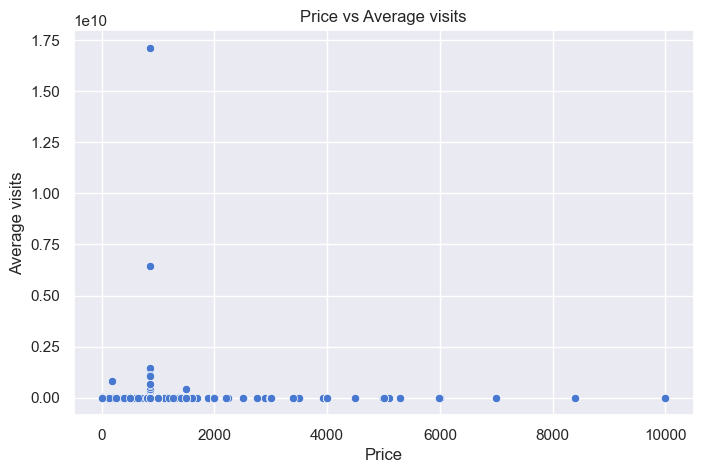

In [1924]:
#price scatter
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='price', y='average visits')
plt.title('Price vs Average visits')
plt.xlabel('Price')
plt.ylabel('Average visits')
plt.show()


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


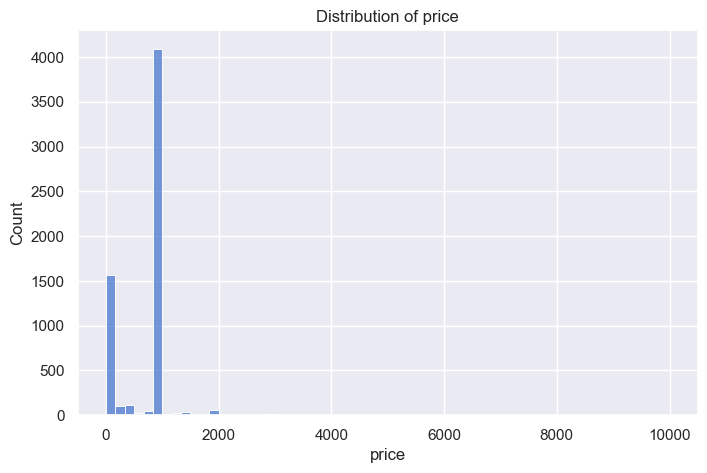

In [1925]:
#price distribution
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='price', bins=60)
plt.title('Distribution of price')
plt.xlabel('price')
plt.ylabel('Count')
plt.show()


In [1926]:

# Convert 'price' to a numeric type, coercing errors to NaN (necessary if any non-numeric strings remain)
df['price'] = pd.to_numeric(df['price'], errors='coerce')

# Define the number of categories
num_categories = 10

# Handle NaN values in 'price' before categorization
# Create a mask for entries with a non-null 'price'
mask = df['price'].notnull()

# Create the price categories based on percentiles of the non-null prices
# Using 'mask' to only calculate quantiles on non-null values
df.loc[mask, 'price_category'] = pd.qcut(df.loc[mask, 'price'], q=num_categories, labels=False, duplicates='drop')

# Fill the NaN values in 'price_category' with a separate category, e.g., -1
df['price_category'].fillna(15, inplace=True)

# Convert 'price_category' to an integer type
df['price_category'] = df['price_category'].astype(int)

# Print the value counts for each category
print(df['price_category'].value_counts())

price_category
3    3967
0     627
1     624
2     601
4     305
Name: count, dtype: int64


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


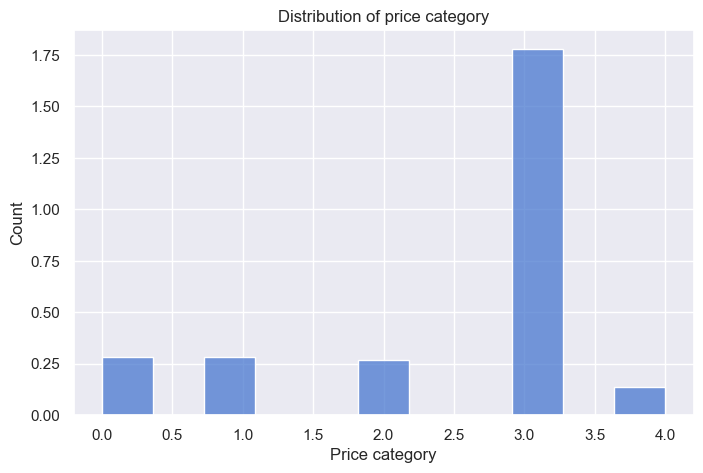

In [1927]:

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='price_category', bins=11,  stat='density')
plt.title('Distribution of price category')
plt.xlabel('Price category')
plt.ylabel('Count')
plt.show()

####  <span style="color:green;font-weight:bold;">Feature 3: Headquarter location</span>


In [1928]:
#df['headquarters_regions'].value_counts()

#string contains europe
df['headquarters_regions'].str.contains('europe').value_counts()

headquarters_regions
False    5741
True      383
Name: count, dtype: Int64

In [1929]:
#hq lcoation head and region
df['headquarters_location'].value_counts()


headquarters_location
not specified                             4812
san francisco california united states     225
new york new york united states             79
london england united kingdom               65
singapore central region singapore          32
                                          ... 
canterbury kent united kingdom               1
guildford surrey united kingdom              1
mnster nordrheinwestfalen germany            1
great neck new york united states            1
kaunas kauno apskritis lithuania             1
Name: count, Length: 359, dtype: Int64

In [1930]:
# code retrieved from ChatGPT (2024)

# Laden van de SpaCy NLP library
nlp = spacy.load('en_core_web_sm')

# Functie om plaatsnamen uit een string te extraheren
def extract_city(text):
    doc = nlp(text)
    cities = [ent.text for ent in doc.ents if ent.label_ == 'GPE']
    return cities[0] if cities else None  # Retourneert de eerste stad of None als er geen gevonden is

# Pas de extract_city functie toe op elke rij in de DataFrame
df['city'] = df['headquarters_location'].apply(lambda x: extract_city(x) if pd.notnull(x) else None)

# Toon de DataFrame met de geëxtraheerde steden
print(df[['headquarters_location', 'city']])

                  headquarters_location       city
1                         not specified       None
2                         not specified       None
3        chicago illinois united states    chicago
22                        not specified       None
23                        not specified       None
...                                 ...        ...
31134            toronto ontario canada       None
31135                     not specified       None
31136                     not specified       None
31137  kaunas kauno apskritis lithuania  lithuania
31138                     not specified       None

[6124 rows x 2 columns]


In [1931]:

# Initialisatie van de SpaCy NLP library
nlp = spacy.load('en_core_web_sm')

# Functie om plaatsnamen uit een string te extraheren
def extract_city(text):
    doc = nlp(text)
    cities = [ent.text for ent in doc.ents if ent.label_ == 'GPE']
    return cities[0] if cities else None  # Retourneert de eerste stad of None

# Get city names to coordinates
def get_coordinates(place_names):
    geolocator = Nominatim(user_agent="geoapiExercises")
    coordinates = {}
    for place in place_names:
        if place not in coordinates:  # Controleer of de coördinaten al opgevraagd zijn
            location = geolocator.geocode(place)
            if location:
                coordinates[place] = (location.latitude, location.longitude)
    return coordinates

# Functie om coördinaten te visualiseren op een kaart
def visualize_on_map(coordinates):
    m = folium.Map(location=[20, 0], zoom_start=2)
    for place, coord in coordinates.items():
        folium.Marker(coord, popup=place).add_to(m)
    return m

# Pas de extract_city functie toe op elke rij in de DataFrame
#df['city'] = df['headquarters_location'].apply(lambda x: extract_city(x) if pd.notnull(x) else None)

# Verwijder None-waarden
#unique_cities = df['city'].dropna()

# Haal coördinaten op voor de unieke steden
#city_coordinates = get_coordinates(unique_cities)

# Visualiseer de steden op een kaart
#map_obj = visualize_on_map(city_coordinates)

# Sla de kaart op als HTML
#map_obj.save('headquarters_map.html')

In [1932]:

# Path to HTML file
file_path = '/Users/macbook/thesis/new/code/headquarters_map.html'

# Display the HTML file as an iframe in the notebook
IFrame(src=file_path, width=700, height=400)


Most tools that have a location specified come from Europa or America

In [1933]:
# sstrategic headquarters location extracting 
df['hq_location'] = df['headquarters_regions'].str.contains('london|los altos|oxford|paris|new york|los angeles|amsterdam|san francisco|bay area|tokyo|boston|beijing|bengaluru|shanghai|tel aviv|singapore', regex=True, na=False)
df['hq_location'] = df['headquarters_location'].str.contains('london|los altos|oxford|paris|new york|los angeles|amsterdam|san francisco|bay area|tokyo|boston|beijing|bengularu|shanghai|tel aviv|singapore', regex=True, na=False)

In [1934]:
df['hq_location'].value_counts()

hq_location
False    5599
True      525
Name: count, dtype: Int64

####  <span style="color:green;font-weight:bold;">Feature 4: Company type</span>


leaving company type out of the analysis because no data on non profit

In [1935]:
# count values of company type 
print(df['company_type'].value_counts())

company_type
For Profit    1489
Non-profit      10
Name: count, dtype: int64


####  <span style="color:green;font-weight:bold;">Criteria: Average visits</span>


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


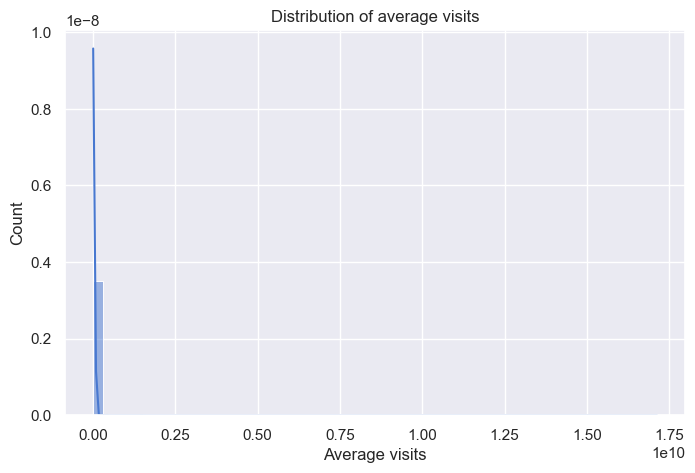

In [1936]:
#plot average_visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.histplot(data=df, x='average visits', bins=60, kde=True, stat='density')
plt.title('Distribution of average visits')
plt.xlabel('Average visits')
plt.ylabel('Count')
plt.show()

The criteria is not normally distrubuted so that needs to be changed.

In [1937]:
# count the percentage of tools with 0 visits
print(len(df[df['average visits'] == 0])/len(df)*100)

# count the percentage of tools with more than 1000000 visits
print(len(df[df['average visits'] > 100000])/len(df)*100)

# count the percentage of tools with more than 1000000 visits
print(len(df[df['average visits'] > 1000000])/len(df)*100)

# count the percentage of tools with more than 10000000 visits
print(len(df[df['average visits'] > 10000000])/len(df)*100)

# count the percentage of tools with more than 20000000 visits
print(len(df[df['average visits'] > 20000000])/len(df)*100)

# count the percentage of tools with more than 30000000 visits
print(len(df[df['average visits'] > 30000000])/len(df)*100)

# count the percentage of tools with more than 100.000.000 visits
print(len(df[df['average visits'] > 100000000])/len(df)*100)

1.7798824297844544
13.76551273677335
3.804702808621816
0.8654474199869366
0.6531678641410843
0.5715218811234487
0.31025473546701504


In [1938]:
#percentage of tools with less than 100 visits
print(len(df[df['average visits'] < 100])/len(df)*100)

#percentage of tools with less than 1000 visits
print(len(df[df['average visits'] < 1000])/len(df)*100)

#percentage of tools with less than 10000 visits
print(len(df[df['average visits'] < 10000])/len(df)*100)

#percentage of tools with less than 100000 visits
print(len(df[df['average visits'] < 100000])/len(df)*100)



7.821685173089484
28.788373612018287
62.49183540169824
86.23448726322664


In [1939]:
# Delete outliers
lower_bound = df['average visits'].quantile(0.015)  # 1.5e percentiel
upper_bound = df['average visits'].quantile(0.985)  # 98.5e percentiel

# Ffilter dataset
df = df[(df['average visits'] > lower_bound) & (df['average visits'] < upper_bound)]

# Toon de resultaten
print(f"rows rijen: {len(df)}")


rows rijen: 5923


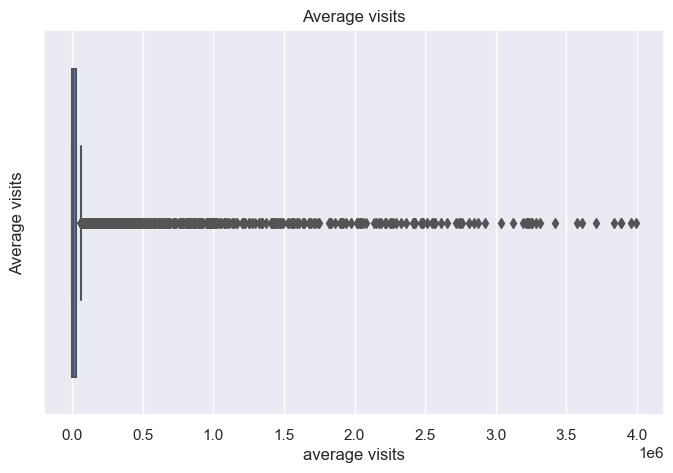

In [1940]:
#boxplot average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='average visits')
plt.title('Average visits')
plt.ylabel('Average visits')
plt.show()


In [1941]:
print(df.shape)
#delete all tools with more than 5.000.000 visits
df = df[df['average visits'] < 5000000]
df.shape

(5923, 34)


(5923, 34)



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


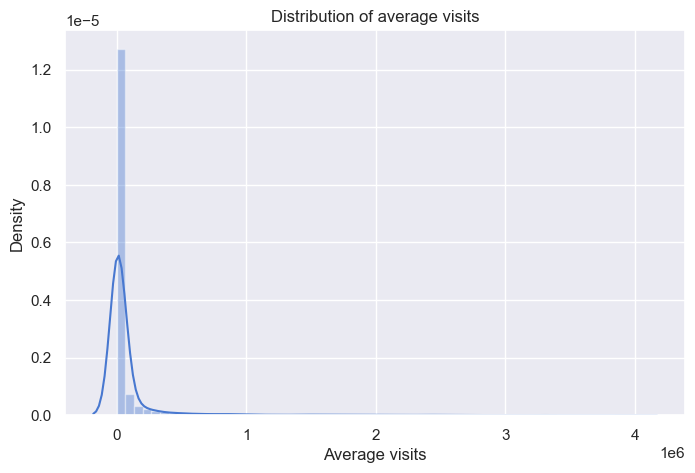

In [1942]:
#distplot average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.distplot(df['average visits'], bins=60, kde=True)
plt.title('Distribution of average visits')
plt.xlabel('Average visits')
plt.ylabel('Density')
plt.show()


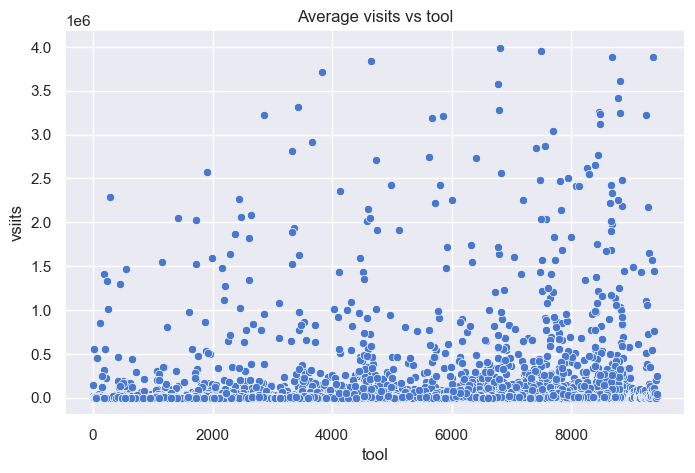

In [1943]:
#scatter of average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x='tool_id', y='average visits')
plt.title('Average visits vs tool')
plt.xlabel('tool')
plt.ylabel('vsiits')
plt.show()


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


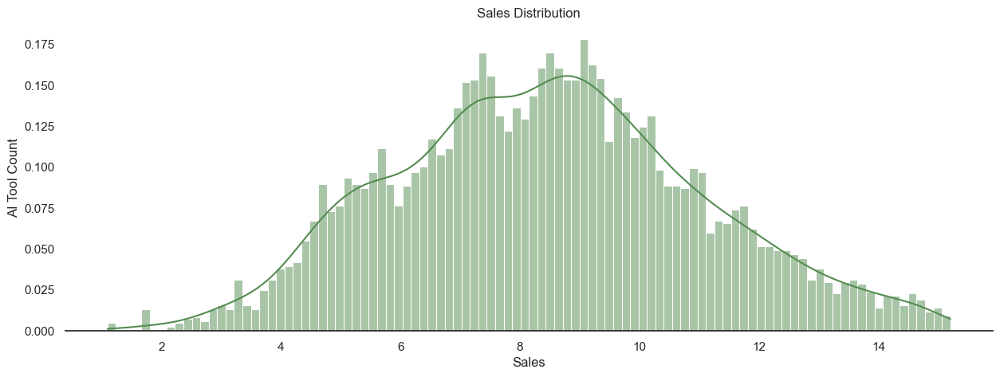

In [1944]:
# log transformaiton of average visits

# Log transformation of the 'average visits' column
df['average_visits'] = np.log(df['average visits'])

# Remove the background
sns.set_style("white")  # This removes the background grid

# Setting the figure size
plt.figure(figsize=(15, 5))

# Creating the histogram plot with pastel green color and KDE
sns.histplot(data=df, x='average_visits', bins=100, color='#538c50', kde=True, stat='density')

# Customizing the plot
plt.title('Sales Distribution')
plt.ylabel('AI Tool Count')
plt.xlabel('Sales')

# Remove the spines (top and right lines)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_visible(False)


# Show the plot
plt.show()


In [1945]:
alpha = 0.1

# Check skewness and kurtosis after transformation
print("Skewness after transformation:", df['average_visits'].skew())
print("Kurtosis after transformation:", df['average_visits'].kurtosis())

# Shapiro-Wilk Test after transformation
stat, p = stats.shapiro(df['average_visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test after transformation
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0) after transformation')
else:
    print('Sample does not look Gaussian (reject H0) after transformation')


Skewness after transformation: 0.1407978975249492
Kurtosis after transformation: -0.3199013415714509
Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0) after transformation


p-value may not be accurate for N > 5000.


Skewness before transformation: 6.486106555860198
Kurtosis before transformation: 48.90413398215163
Statistics=0.271, p=0.000
Sample does not look Gaussian (reject H0)
Skewness after transformation: 0.006237094279017541
Kurtosis after transformation: -0.34053191466242305
Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0) after transformation


p-value may not be accurate for N > 5000.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


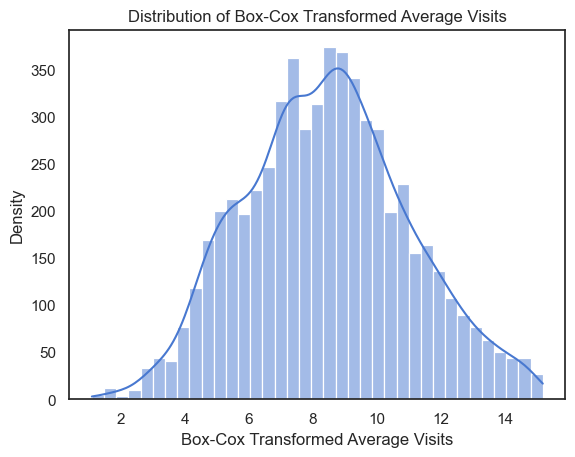

In [1946]:


# Assuming 'df' is your DataFrame and 'average_visits' is the column with the skewed data

# Check skewness and kurtosis before transformation
print("Skewness before transformation:", df['average visits'].skew())
print("Kurtosis before transformation:", df['average visits'].kurtosis())

# Shapiro-Wilk Test before transformation
stat, p = stats.shapiro(df['average visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

# Apply Box-Cox Transformation
df['box_average_visits'], fitted_lambda = stats.boxcox(df.loc[df['average visits'] > 0, 'average visits'])

# Check skewness and kurtosis after transformation
print("Skewness after transformation:", df['box_average_visits'].skew())
print("Kurtosis after transformation:", df['box_average_visits'].kurtosis())

# Shapiro-Wilk Test after transformation
stat, p = stats.shapiro(df['average_visits'])
print('Statistics=%.3f, p=%.3f' % (stat, p))

# Interpretation of Shapiro-Wilk Test after transformation
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0) after transformation')
else:
    print('Sample does not look Gaussian (reject H0) after transformation')

# Plot the transformed average_visits
sns.histplot(df['average_visits'], kde=True)
plt.title('Distribution of Box-Cox Transformed Average Visits')
plt.xlabel('Box-Cox Transformed Average Visits')
plt.ylabel('Density')
plt.show()


In [1947]:
df.shape

(5923, 36)

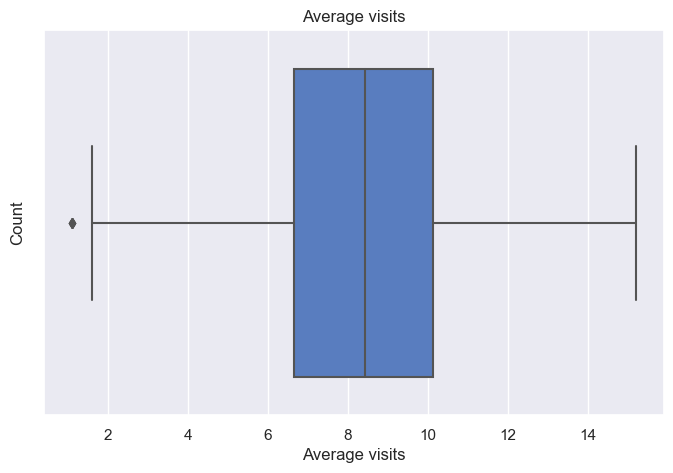

In [1948]:
#boxplot of average visits
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='average_visits')
plt.title('Average visits')
plt.xlabel('Average visits')
plt.ylabel('Count')
plt.show()

The histogram with the kernel density estimate suggests that the log transformation has improved the distribution of average_visits, making it look more like a normal distribution, although the D'Agostino's K^2 test still indicates a significant departure from normality.

Given the skewness and kurtosis values are close to zero (which would be expected in a normal distribution), and considering the visual evidence from the histogram, it's likely that the dataset is sufficiently close to normal for many practical purposes.

####  <span style="color:green;font-weight:bold;">Feature 10: Total funding amount</span>


The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


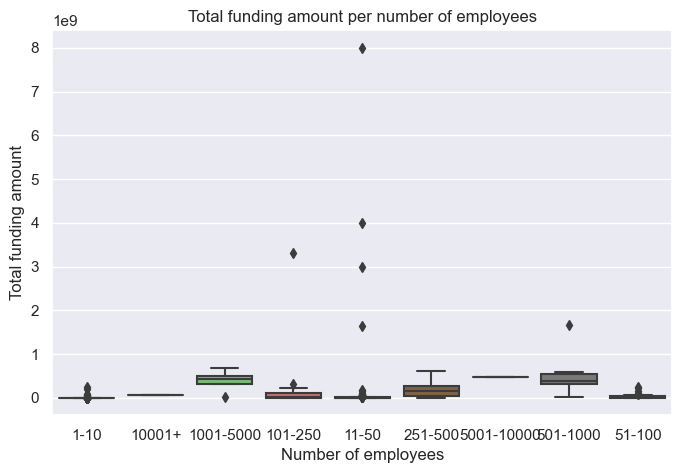

In [1949]:
# boxplot of total funding and number of employees
plt.figure(figsize=(8, 5))
sns.boxplot(data=df, y='total_funding_amount', x='number_of_employees')
plt.title('Total funding amount per number of employees')
plt.xlabel('Number of employees')
plt.ylabel('Total funding amount')
plt.show()

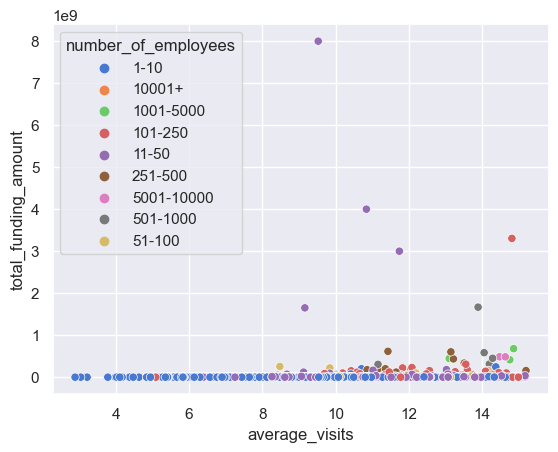

In [1950]:
# plot of average visits, employees and funding with employee categories as colours
sns.scatterplot(x='average_visits', y='total_funding_amount', hue='number_of_employees', data=df)
plt.show()

In [1951]:
print(df['total_funding_amount'].skew())
print(df['total_funding_amount'].kurtosis())

# D'Agostino's K^2 Test on the log-transformed data
stat, p = stats.normaltest(df['total_funding_amount'])
print(f'Statistics={stat:.3f}, p={p:.3f}')

43.63055431418544
2254.440806873394
Statistics=17798.911, p=0.000


We have got some outliers so we will remove them.

In [1952]:
#fill nans with 0 
df['total_funding_amount'] = df['total_funding_amount'].fillna(0)

#remove outliers from total funding amount
print(len(df[df['total_funding_amount'] < 100000000]))
print(len(df[df['total_funding_amount'] > 100000000]))

#percentage
print(len(df[df['total_funding_amount'] > 100000000])/len(df)*100)
print(len(df[df['total_funding_amount'] > 10000000])/len(df)*100)
print(len(df[df['total_funding_amount'] > 1000000])/len(df)*100)

#delete outliers
df = df[df['total_funding_amount'] < 1000000000]


5878
44
0.7428667904777985
3.342900557150093
7.546851257808543


In [1953]:
df.shape

(5917, 36)

####  <span style="color:green;font-weight:bold;">Feature 14: IPO Status</span>


In [1954]:
# count IPO status
print(df['ipo_status'].value_counts())

#change delisted to NaN
df['ipo_status'] = df['ipo_status'].replace('Delisted', np.NaN)

ipo_status
Private     1429
Public         7
Delisted       1
Name: count, dtype: int64


dropping ipo status as we have no info

####  <span style="color:green;font-weight:bold;">Feature 16: Early Stage Funding</span>


In [1955]:
df.loc[(df['total_funding_amount'] > 0) & (df['merged_months'] < 12), 'funding_stage'] = True


Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.


In [1956]:
#df funding stage is true
print(df['funding_stage'].value_counts())

funding_stage
True    59
Name: count, dtype: int64


# 4.  Natural Language Processing

####  <span style="color:green;font-weight:bold;">Feature 5: Category </span>


In [1957]:
# importing categories

data= pd.read_csv('/Users/macbook/thesis/new/code/data/processed_data/category_df2.csv')

# merge data and new_df_2 on tool_id
df = pd.merge(df, data[['tool_id', 'category']], on='tool_id', how='left')

In [1958]:
df.shape

(5917, 38)

In [1959]:
categories = [
    (0, '3D Digital Replicas', 'Outputs 3D digital models or simulations of real-world objects.'),
    (1, 'Processed Data', 'Outputs datasets.'),
    (2, 'Streamlined Processes', 'Offers automated sequences or optimized workflows as a result of process management tools.'),
    (3, 'Generated Text', 'Produces written content, including edited, analyzed, or synthesized text documents.'),
    (4, 'Multimodal', 'Creates content that integrates multiple outputs.'),
    (5, 'Software Solutions', 'Generates code, software patches, testing results, or programming-related documents.'),
    (6, 'Analytical Insights', 'Delivers insights or predictions based on data analysis.'),
    (7, 'Audio Files', 'Produces sound recordings, edited audio clips, or synthesized speech outputs.'),
    (8, 'Video Content', 'Generates edited video sequences, visual effects, or complete video productions.'),
    (9, 'Enhanced Images', 'Enhances, alters, or creates digital images and graphics.'),
    (10, 'Operational Outputs', 'Provides network configurations, management plans, or support-related documentation.')
]

names = pd.DataFrame(categories, columns=['category_id', 'category_name', 'description_category'])

df = pd.merge(names, df, left_on='category_id', right_on='category', how='right')


In [1960]:
df.sample(1)

,category_id,category_name,description_category,tool_id,company_type,average visits,task,price,saves,likes,ipo_status,description,stars,period,headquarters_location,founded_date,headquarters_regions,number_of_employees,number_of_founders,full_description,number_of_funding_rounds,freemium,total_funding_amount,number_of_investors,review_text,helpful_count,all_time_score,review_id,amount_of_reviews,recent_review_score,recent_reviews_amount,months_since_period,months_since_founded,merged_months,price_category,city,hq_location,average_visits,box_average_visits,funding_stage,category
4679,3.0,Generated Text,"Produces written content, including edited, an...",9321,For Profit,64139.0,not specified,859.098663,NaN,2.4451,Private,All-in-One Social Media Management Tools and C...,3.815774,<NA>,clujnapoca cluj romania,2016-06-01,european union eu europe middle east and afric...,11-50,2.0,"More Leads, Less Effort. SocialBee offers Soci...",0.0,NaN,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,NaN,92.0,92.0,3,None,False,11.068808,9.874712,NaN,3.0


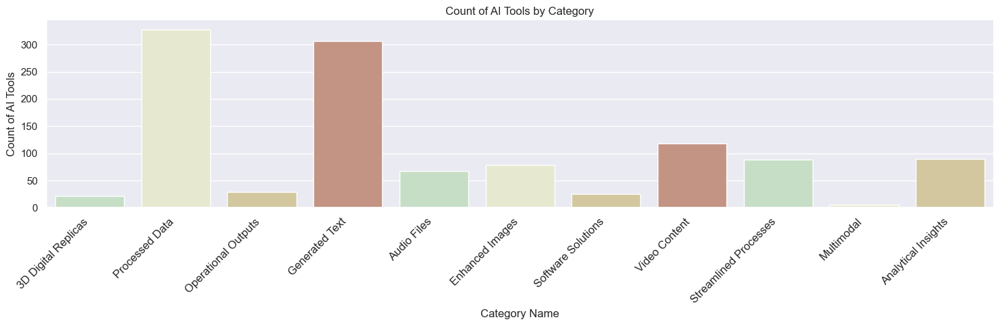

In [1961]:
# Define a custom pastel palette
custom_palette = ['#C3E2C2', '#EAECCC', '#DBCC95', '#CD8D7A']

# Creating the count plot with the custom palette
plt.figure(figsize=(15, 5))
sns.countplot(data=df, x='category_name', palette=custom_palette)

plt.title('Count of AI Tools by Category')
plt.ylabel('Count of AI Tools')
plt.xlabel('Category Name')

plt.xticks(rotation=45, ha='right', fontsize=12)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()

In [1962]:
df.head()

#save to csv
df.to_csv('/Users/macbook/thesis/new/code/data/processed_data/df2.csv')


In [1963]:

# function for categories employees
def categorize_employees(category):
    if category in ['1-10']:
        return 'small'
    elif category in ['11-50', '51-100', '101-250']:
        return 'medium'
    else:
        return 'big'

# Toepassen van de functie op de 'number_of_employees' kolom
df['size_category'] = df['number_of_employees'].apply(categorize_employees)

# Function for categories
def categorize_output(category):
    if category in [0.0, 3.0, 5.0, 7.0, 8.0, 9.0]:
        return 'creative output'
    elif category in [1.0, 2.0, 4.0, 6.0, 10.0]:
        return 'technical output'
    else:
        return 'undefined'

# Toepassen van de functie op de 'category' kolom
df['output_type'] = df['category'].apply(categorize_output)

df.sample(3)


,category_id,category_name,description_category,tool_id,company_type,average visits,task,price,saves,likes,ipo_status,description,stars,period,headquarters_location,founded_date,headquarters_regions,number_of_employees,number_of_founders,full_description,number_of_funding_rounds,freemium,total_funding_amount,number_of_investors,review_text,helpful_count,all_time_score,review_id,amount_of_reviews,recent_review_score,recent_reviews_amount,months_since_period,months_since_founded,merged_months,price_category,city,hq_location,average_visits,box_average_visits,funding_stage,category,size_category,output_type
4067,NaN,NaN,NaN,6347,NaN,14384.0,text to speech,29.000000,23.0,2.4451,NaN,<NA>,1.000000,january,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,Yes,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,0.0,NaN,0.0,1,None,False,9.573872,8.671465,NaN,NaN,NaN,undefined
19,1.0,Processed Data,Outputs datasets.,8526,For Profit,6783.0,data analytics for restaurants,859.098663,14.0,2.4451,Private,5-Out allows to maximize restaurant profitabil...,3.815774,2021,new york new york united states,2020-01-01,greater new york area east coast northeastern us,1-10,1.0,"5-Out uses machine learning, artificial intell...",1.0,NaN,2500000.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,36.0,49.0,42.5,3,new york,True,8.822175,8.051990,NaN,1.0,small,technical output
2865,3.0,Generated Text,"Produces written content, including edited, an...",9146,For Profit,1727.0,not specified,859.098663,NaN,2.4451,Private,Kodif.ai is a customer experience platform tha...,3.815774,<NA>,palo alto california united states,2021-01-01,san francisco bay area silicon valley west coast,11-50,NaN,Kodif.ai is a customer experience platform tha...,0.0,NaN,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,NaN,37.0,37.0,3,palo alto,False,7.454141,6.899149,NaN,3.0,medium,creative output


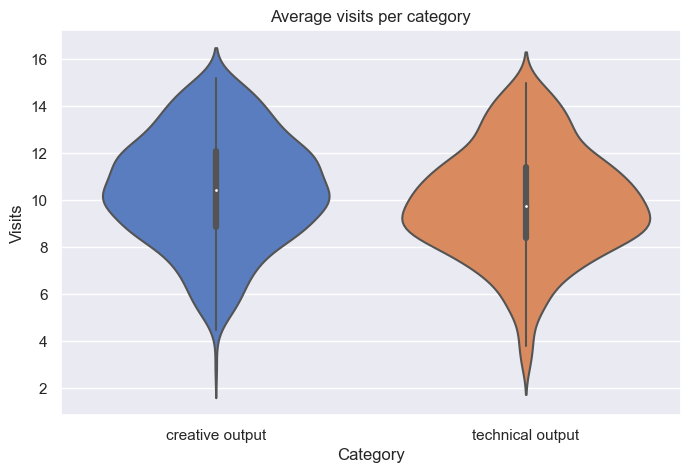

In [1964]:
# Filter DataFrame to include only 'creative output' and 'technical output'
df_filtered = df[df['output_type'].isin(['creative output', 'technical output'])]

sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.violinplot(data=df_filtered, x='output_type', y='average_visits')
plt.title('Average visits per category')
plt.xlabel('Category')
plt.ylabel('Visits')
plt.show()

In [1965]:
# Replace 'your_numerical_column' with the name of your numerical column
creative_mean = df[df['output_type'] == 'creative output']['average_visits'].mean()
technical_mean = df[df['output_type'] == 'technical output']['average_visits'].mean()

# Replace 'your_numerical_column' with the name of your numerical column
value_count =df['output_type'].value_counts()

print('Creative Mean:', creative_mean)
print('Technical Mean:', technical_mean)
print('Values count of output type', value_count)

Creative Mean: 10.450577774386677
Technical Mean: 9.863748209542026
Values count of output type output_type
undefined           4759
creative output      617
technical output     541
Name: count, dtype: int64


Creative output has higher average sales

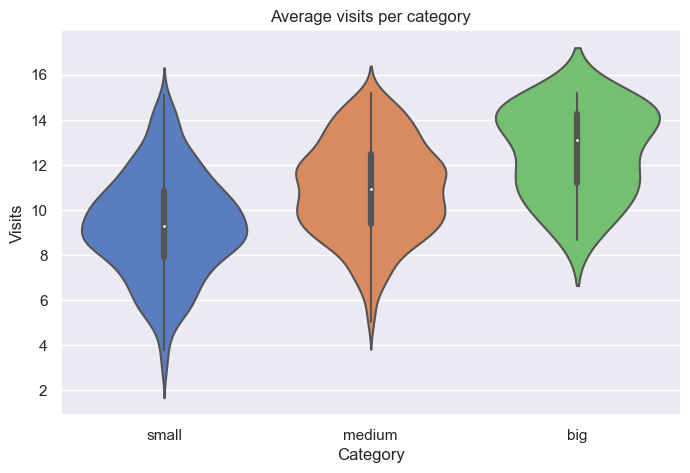

In [1966]:
# Filter DataFrame to include only 'creative output' and 'technical output'
df_filtered = df[df['size_category'].isin(['big', 'medium', 'small'])]

sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

plt.figure(figsize=(8, 5))
sns.violinplot(data=df_filtered, x='size_category', y='average_visits')
plt.title('Average visits per category')
plt.xlabel('Category')
plt.ylabel('Visits')
plt.show()

# 5. Latent Dirichlet Allocation & Sentiment Analysis

Importing CSV and merging to df

####  <span style="color:green;font-weight:bold;">Feature 13 & 14: Topics & Sentiment </span>


In [1967]:
data = pd.read_csv('/Users/macbook/thesis/new/code/data/processed_data/topics_sentiment.csv')
data.columns

Index(['tool_id', 'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant'],
      dtype='object')

In [1968]:
df = pd.merge(df, data[['tool_id', 'collaboration_sent', 'innovative_sent', 'information_sent',
       'service_sent', 'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_management', 'product', 'content_creation',
       'customer_support', 'ease_of_use', 'workflow_optimization',
       'ai_assistant']], on='tool_id', how='left')
df.drop_duplicates(subset=['tool_id'], keep='first', inplace=True)

In [1969]:
df.shape

(5917, 73)

In [1970]:
#count unique valies df
print(df['tool_id'].nunique())
print(df.shape)
df.head()

5917
(5917, 73)


,category_id,category_name,description_category,tool_id,company_type,average visits,task,price,saves,likes,ipo_status,description,stars,period,headquarters_location,founded_date,headquarters_regions,number_of_employees,number_of_founders,full_description,number_of_funding_rounds,freemium,total_funding_amount,number_of_investors,review_text,helpful_count,all_time_score,review_id,amount_of_reviews,recent_review_score,recent_reviews_amount,months_since_period,months_since_founded,merged_months,price_category,city,hq_location,average_visits,box_average_visits,funding_stage,category,size_category,output_type,collaboration_sent,innovative_sent,information_sent,service_sent,business_development_sent,content_management_sent,user_experience_sent,design_sent,time_management_sent,product_sent,content_creation_sent,customer_support_sent,ease_of_use_sent,workflow_optimization_sent,ai_assistant_sent,collaboration,innovative,information,service,business_development,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant
0,NaN,NaN,NaN,1471,NaN,595.0,image coloring,39.000000,3.0,2.4451,NaN,<NA>,5.000000,july,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,NaN,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,6.0,NaN,6.0,1,None,False,6.388561,5.977918,NaN,NaN,NaN,undefined,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,7978,NaN,2466.0,phone case designs,859.098663,14.0,2.4451,NaN,<NA>,3.815774,2022,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,Yes,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,24.0,NaN,24.0,3,None,False,7.810353,7.202530,NaN,NaN,NaN,undefined,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,437,NaN,130.0,customer support,12.000000,150.0,1.0000,NaN,<NA>,5.000000,august,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,Yes,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,5.0,NaN,5.0,0,None,False,4.867534,4.626645,NaN,NaN,NaN,undefined,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,128,NaN,2526.0,avatars,6.000000,43.0,2.4451,NaN,<NA>,3.815774,september,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,NaN,0.0,0.0,I wanted this to be great - handed over some c...,0.0,NaN,review-701152,0.0,1.0,0.0,4.0,NaN,4.0,0,None,False,7.834392,7.222922,NaN,NaN,NaN,undefined,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,NaN,NaN,0.5,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.5,0.0,0.0,0.0
4,NaN,NaN,NaN,4225,NaN,1879.0,chatgpt,859.098663,6.0,2.4451,NaN,<NA>,3.815774,april,not specified,NaT,not specified,NaN,NaN,<NA>,0.0,NaN,0.0,0.0,<NA>,NaN,NaN,<NA>,0.0,NaN,0.0,9.0,NaN,9.0,3,None,False,7.538495,6.971198,NaN,NaN,NaN,undefined,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


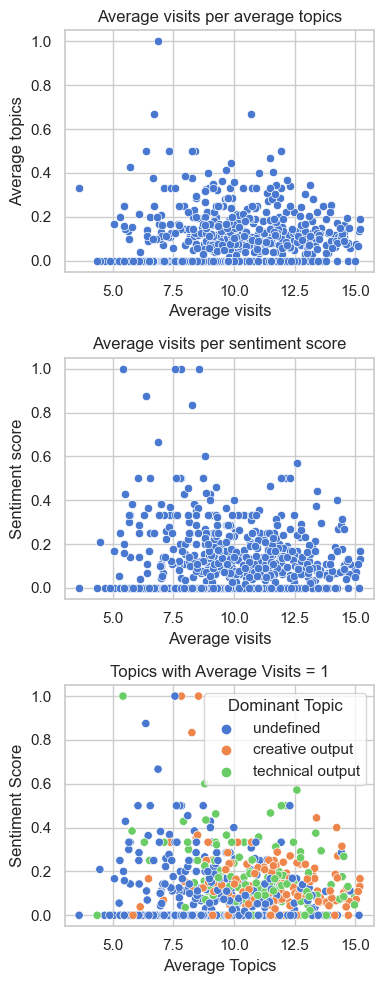

In [1971]:
sns.set_style('whitegrid')
sns.set_palette('muted')
sns.set_context('notebook', font_scale=1.0)

fig, axs = plt.subplots(3, 1, figsize=(4, 10))

sns.scatterplot(data=df, x='average_visits', y='collaboration', ax=axs[0])
axs[0].set_title('Average visits per average topics')
axs[0].set_xlabel('Average visits')
axs[0].set_ylabel('Average topics')

sns.scatterplot(data=df, x='average_visits', y='customer_support', ax=axs[1])
axs[1].set_title('Average visits per sentiment score')
axs[1].set_xlabel('Average visits')
axs[1].set_ylabel('Sentiment score')

sns.scatterplot(data=df, x='average_visits', y='customer_support', hue='output_type', ax=axs[2])
axs[2].set_title('Topics with Average Visits = 1')
axs[2].set_xlabel('Average Topics')
axs[2].set_ylabel('Sentiment Score')
axs[2].legend(title='Dominant Topic')

plt.tight_layout()
plt.show()

# 6. Correlation, imputation, VIF & mediation

First we start with correlation, then we will do imputation and VIF, and linearity check between criteria and predictors.

In between some extra feature engineering will be done.

But first selecting relevant columns.

Code is retrieved from:.

ChatGPT. (2024). https://chat.openai.com/

Bhaumik, D & Dey, D (2023). BrightSpace. Linear-Logistic Regression.ipynb  from AI methods course

And also existing code from courses is used.

## Making new df for analysis

In [1972]:
features = ['price_category',  'price', 'freemium', 'funding_stage', 'company_type', 'months_since_founded', 'months_since_period', 'average_visits', 'merged_months', 'category', 'hq_location', 'saves', 'likes','stars', 'helpful_count', 'number_of_founders', 'number_of_investors', 
            'number_of_funding_rounds', 'total_funding_amount', 'all_time_score', 'ipo_status', 'amount_of_reviews',
              'collaboration_sent', 'innovative_sent', 'size_category', 'output_type',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

In [1973]:
b = df[features]

In [1974]:
c = df[['tool_id'] + features].drop_duplicates(subset=['tool_id'], keep='first')

In [1975]:
#if nan fill with 0 in funding stage
c['funding_stage'] = c['funding_stage'].fillna(0)

#change true to 1
c['funding_stage'] = c['funding_stage'].astype(int)

#funding stage to boolean
c['funding_stage'] = c['funding_stage'].astype('bool')


In [1976]:
import pandas as pd

# Assuming 'b' is your DataFrame with the data.
df_summary_list = []

#drop tool id
#c = c.drop(['tool_id'], axis=1)

# Loop through each column and calculate the mean (if applicable) and sparsity.
for column in c.columns:
    data_dict = {'Column': column, 'Dtype': str(c[column].dtype)}
    
    # Calculate sparsity for all columns.
    data_dict['Sparsity (%)'] = "{:.2f}".format((c[column].isnull().sum() / len(c[column])) * 100)
    
    # Calculate mean if the column is numeric.
    if c[column].dtype in ['int64', 'float64']:
        # Format the mean with two decimal places and comma as thousand separator.
        data_dict['Mean'] = "{:,.2f}".format(c[column].mean())
    else:
        data_dict['Mean'] = None  # Non-numeric columns get a None value.
    
    # Append the dictionary to the list.
    df_summary_list.append(data_dict)

# Create the summary DataFrame from the list of dictionaries.
df_summary = pd.DataFrame(df_summary_list)

#save to excel
df_summary.to_excel('/Users/macbook/thesis/new/code/data/raw_data/c_summary.xlsx')


In [1977]:
#change price category to category
c['price_category'] = c['price_category'].astype('category')

#change category to category
c['category'] = c['category'].astype('category')

#hange number of employees to category
#c['number_of_employees'] = c['number_of_employees'].astype('category')

#change all time score to float after changing New_Category to 0
c['all_time_score'] = c['all_time_score'].replace('New_Category', '0').astype(float)

#helpful count to int replace new category with 0
c['helpful_count'] = c['helpful_count'].replace('New_Category', '0').astype(float)

#size category to category
c['size_category'] = c['size_category'].astype('category')

#output type to category
c['output_type'] = c['output_type'].astype('category')


## 6.1 Correlation analysis

For this we will first check which feature variables are correlated to the target variable. Note that we have both continuous and categorical feature variables, and the target variable is a continuous variable. Therefore, we will have to use different correlation methods, based on the nature of the variables.
- continuous <-> continuous -> Pearson's linear correlation
- ordinal <-> ordinal -> Spearman's rank correlation for understanding montonic relationships. Can also be used for continuous variables to study non linear associations.  
- nominal <-> continuous -> t-tests/ANOVA/Kruskal-Wallis H-test


In [1978]:
# Defining the numerical feature variables
num_features = ['average_visits', 'merged_months',
        'saves', 'likes', 'stars',
        'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'amount_of_reviews',
       'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']

# Defining the categorical feature variables
cat_features = [ 'number_of_employees', 'hq_location', 'price_category', 'category', 'freemium', 'funding_stage', 'size_category', 'output_type']

### 4.1.1 Correlation Analysis between the numerical variables

Used Spearman because it is non-parametric, so it is not sensitive to normality distribution

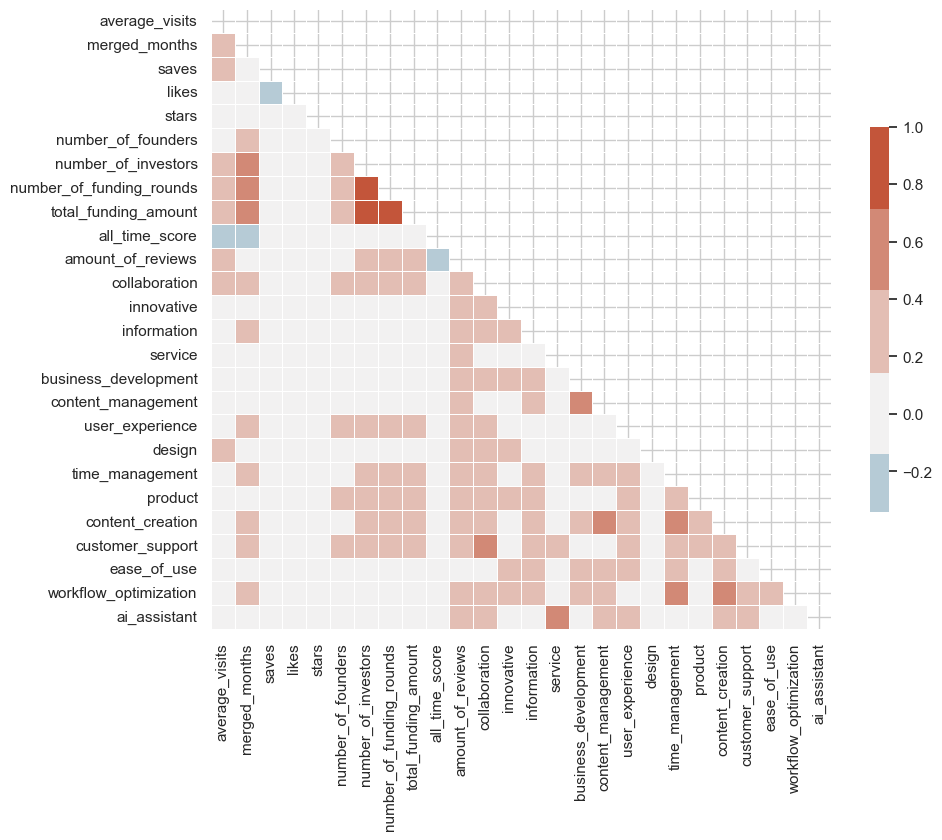

In [1979]:
# Increase the size of the heatmap
plt.figure(figsize=(10, 10))

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(c[num_features].corr(method='spearman'), dtype=bool))

# Choose a diverging color palette with at least 5 colors
cmap = sns.diverging_palette(230, 20, as_cmap=False, n=7)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(c[num_features].corr(method='spearman'), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)

# Adjust font size
sns.set(font_scale=1.25)

plt.show()

From the Spearman correlation heatmap:

'Total_funding_amount' shows notable correlations with 'number_of_funding_rounds' (0.7) and 'number_of_investors' (0.69), indicating higher funding is associated with more rounds and investors.
'Average visits' shows moderate correlation with 'total_funding_amount' (0.57), suggesting some relationship between funding and site traffic.
Variables like 'saves', 'likes', and 'number_of_founders' have low correlations with 'average visits', hinting they may have less direct influence on site traffic.
Regularization may be needed in a regression model to address potential overfitting due to these low correlations.

In [1980]:
#correlation on dep var 'average_visits'
correlation = c[num_features].corr()['average_visits'].sort_values(ascending=False)

# Print the top 15 positive correlations
print(correlation)

average_visits              1.000000
merged_months               0.409276
number_of_funding_rounds    0.297703
number_of_investors         0.256096
saves                       0.227039
amount_of_reviews           0.184255
total_funding_amount        0.164666
number_of_founders          0.132853
collaboration               0.059829
design                      0.055295
ease_of_use                 0.052786
likes                       0.034311
user_experience             0.022959
content_creation            0.018494
innovative                 -0.001351
time_management            -0.002325
service                    -0.018934
content_management         -0.024687
stars                      -0.027342
ai_assistant               -0.027529
workflow_optimization      -0.037525
business_development       -0.042296
customer_support           -0.058180
information                -0.089359
product                    -0.093281
all_time_score             -0.153755
Name: average_visits, dtype: float64


### 4.1.2 Correlation Analysis between the categorical variables


The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


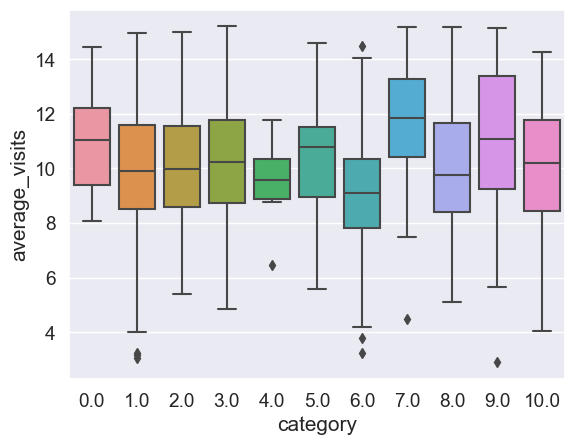

category
1.0     328
3.0     307
8.0     118
6.0      90
2.0      88
9.0      78
7.0      67
10.0     29
5.0      25
0.0      22
4.0       6
Name: count, dtype: int64


In [1981]:
# boxplots of different categories of number of employees
sns.boxplot(x='category', y='average_visits', data=c)
plt.show()

#count amount of values in each category
print(c['category'].value_counts())

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


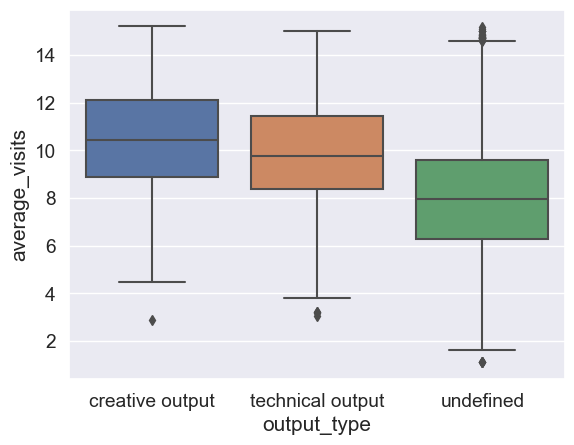

category
1.0     328
3.0     307
8.0     118
6.0      90
2.0      88
9.0      78
7.0      67
10.0     29
5.0      25
0.0      22
4.0       6
Name: count, dtype: int64


In [1982]:
# boxplots of different categories of number of employees
sns.boxplot(x='output_type', y='average_visits', data=c)
plt.show()

#count amount of values in each category
print(c['category'].value_counts())

In [1983]:
#make an seperate df for each category
df_emp1 = c[c['size_category'] == 'big']['average_visits'].values
df_emp2 = c[c['size_category'] == 'medium']['average_visits'].values
df_emp3 = c[c['size_category'] == 'small']['average_visits'].values

#output type
df_cat1 = c[c['output_type'] == 'creative output']['average_visits'].values
df_cat2 = c[c['output_type'] == 'technical output']['average_visits'].values
df_cat3 = c[c['output_type'] == 'undefined']['average_visits'].values




The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


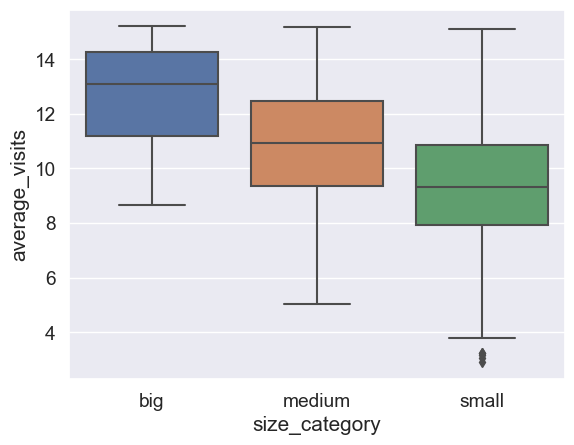

category
1.0     328
3.0     307
8.0     118
6.0      90
2.0      88
9.0      78
7.0      67
10.0     29
5.0      25
0.0      22
4.0       6
Name: count, dtype: int64


In [1984]:
# boxplots of different categories of number of employees
sns.boxplot(x='size_category', y='average_visits', data=c)
plt.show()

#count amount of values in each category
print(c['category'].value_counts())

When lower than 10 it will not be incorporated in analysis

In [1985]:
#count amount of values in each category
print(df['price_category'].value_counts())

price_category
3    3811
1     613
0     609
2     587
4     297
Name: count, dtype: int64


In [1986]:
#different df for each category
df_price_1 = df[df['price_category'] == 0]['average visits'].values
df_price_2 = df[df['price_category'] == 1]['average visits'].values
df_price_3 = df[df['price_category'] == 2]['average visits'].values
df_price_4 = df[df['price_category'] == 3]['average visits'].values



In [1987]:
import scipy.stats as stats

In [1988]:
#hq location in non hq location and hq location
df_hq_1 = c[c['hq_location'] == False]['average_visits'].values
df_hq_2 = c[c['hq_location'] == True]['average_visits'].values

In [1989]:
#ipo status
df_ipo_1 = c[c['ipo_status'] == 'Public']['average_visits'].values
df_ipo_2 = c[c['ipo_status'] == 'Private']['average_visits'].values

#as boolean



In [1990]:
#count values of hq location
print(c['hq_location'].value_counts())

hq_location
False    5420
True      497
Name: count, dtype: Int64


In [1991]:
#Hypothesis
#H0: The average visits of the different categories of number of employees are equal
#H1: The average visits of the different categories of number of employees are not equal

#kruskal wallis test for all categories
alpha = 0.05
test_stat, p_val = stats.kruskal(df_emp1, df_emp2, df_emp3)
print('The p-value for employeestest for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')


#kruskal wallis test for all categories
alpha = 0.05
test_stat, p_val = stats.kruskal(df_cat1, df_cat2, df_cat3)
print('The p-value for output for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')


test_stat, p_val = stats.kruskal(df_price_1, df_price_2, df_price_3, df_price_4)
print('The p-value for price category test for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')


#perform t test
alpha = 0.1
test_stat, p_val = stats.ttest_ind(df_hq_1, df_hq_2)
print('The p-value for  test for T-test:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

#perform t test
alpha = 0.1
test_stat, p_val = stats.kruskal(df_hq_1, df_hq_2)
print('The p-value for h q locationtest for Kruskal:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')


#perform kruskal
alpha = 0.1
test_stat, p_val = stats.ttest_ind(df_ipo_1, df_ipo_2)
print('The p-value for ipo for Kruskal-Wallis H rating:', p_val)

if p_val < alpha:
    print('The null hypothesis is rejected')
else:
    print('The null hypothesis is accepted')

    

The p-value for employeestest for Kruskal-Wallis H rating: 4.416363286057028e-37
The null hypothesis is rejected
The p-value for output for Kruskal-Wallis H rating: 3.3136349837532374e-142
The null hypothesis is rejected
The p-value for price category test for Kruskal-Wallis H rating: 0.09431531565805981
The null hypothesis is accepted
The p-value for  test for T-test: 2.1000839398028138e-75
The null hypothesis is rejected
The p-value for h q locationtest for Kruskal: 5.648439995726886e-71
The null hypothesis is rejected
The p-value for ipo for Kruskal-Wallis H rating: 0.000284759515775375
The null hypothesis is rejected


use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
The default of observed=False is deprecated an

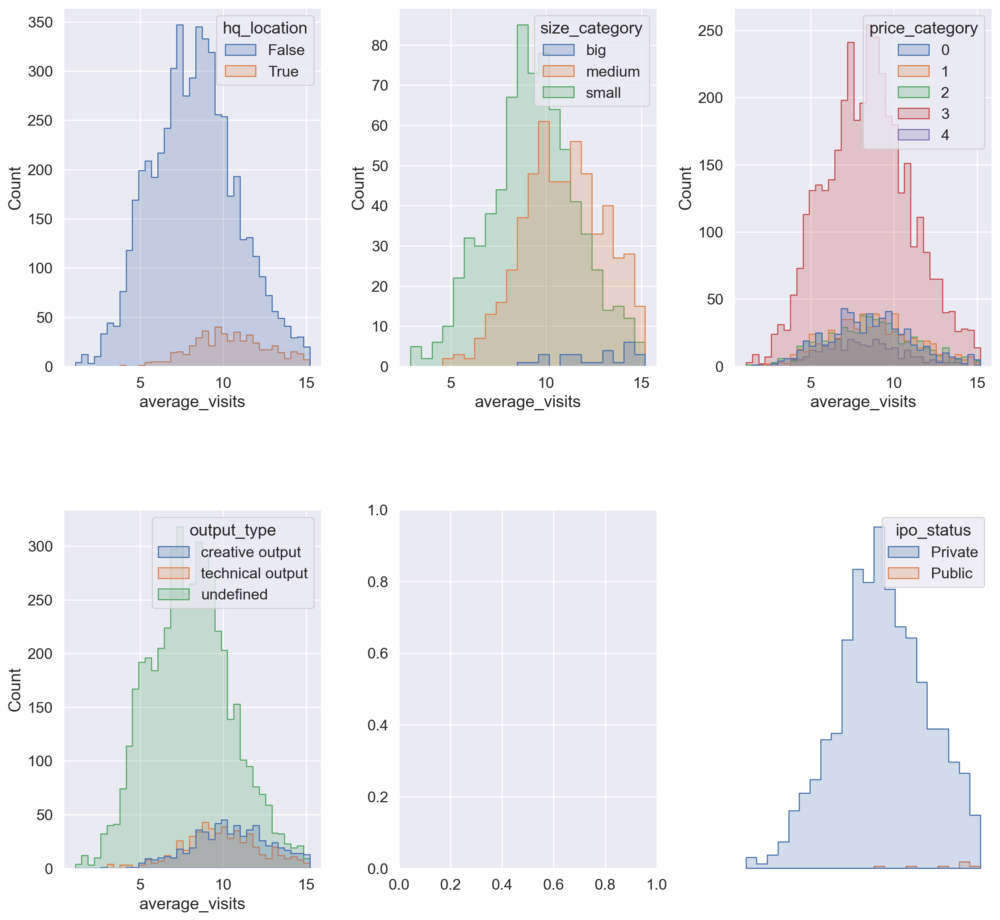

In [1992]:
import seaborn as sns
import seaborn as sns
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 14), dpi=200, gridspec_kw={'hspace': 0.4, 'wspace': 0.3})

sns.histplot(data=c, x="average_visits", hue="hq_location", element="step", ax=axes[0, 0])
sns.histplot(data=c, x="average_visits", hue="size_category", element="step", ax=axes[0, 1])
sns.histplot(data=c, x="average_visits", hue="price_category", element="step", ax=axes[0, 2])
sns.histplot(data=c, x="average_visits", hue="output_type", element="step", ax=axes[1, 0])
sns.histplot(data=c, x="average_visits", hue="ipo_status", element="step", ax=axes[1, 2])

axes[1, 2].axis('off')  # Empty subplot

plt.show()

In [1993]:
c.shape

(5917, 55)

In [1994]:
#print count values of c hq location
print(c['hq_location'].value_counts())

hq_location
False    5420
True      497
Name: count, dtype: Int64


In [1995]:
b.shape

(5917, 54)

In [1996]:
b.dtypes

price_category                   int64
price                          float64
freemium                      category
funding_stage                   object
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                  float64
category                       float64
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
size_category                   object
output_type              

In [1997]:
b.isnull().sum()

price_category                   0
price                            0
freemium                      4160
funding_stage                 5858
company_type                  4488
months_since_founded          4561
months_since_period            118
average_visits                   0
merged_months                    0
category                      4759
hq_location                      0
saves                          433
likes                            0
stars                            0
helpful_count                 5244
number_of_founders            4893
number_of_investors              0
number_of_funding_rounds         0
total_funding_amount             0
all_time_score                5252
ipo_status                    4481
amount_of_reviews                0
collaboration_sent            5514
innovative_sent               5444
size_category                 4583
output_type                      0
information_sent              5544
service_sent                  5454
business_development

## 6.2 Imputation

We will impute some features as there are NaN's

In [1998]:
def percent_missing(c):
    missing = round(b.isnull().sum() * 100 / df.shape[0], 2).sort_values(ascending=False)
    return missing

percent_missing(c)

funding_stage                 99.00
design_sent                   94.63
information_sent              93.70
collaboration_sent            93.19
customer_support_sent         93.04
workflow_optimization_sent    92.46
content_management_sent       92.21
business_development_sent     92.18
service_sent                  92.18
innovative_sent               92.01
time_management_sent          91.80
ai_assistant_sent             91.67
user_experience_sent          91.65
product_sent                  91.63
content_creation_sent         91.41
ease_of_use_sent              90.67
workflow_optimization         88.86
ease_of_use                   88.86
customer_support              88.86
content_creation              88.86
design                        88.86
product                       88.86
user_experience               88.86
time_management               88.86
collaboration                 88.86
information                   88.86
service                       88.86
business_development        

Some have NaN values, so we will have to impute them. 

number_of_founders is moderalty correlated with other variables moderatly correlated so we will impute them using KNN.

#based on the cases we will change the data

Case 1: Missing because it's logically absent

number_of_funding_rounds: If no funding rounds are listed, it could imply the company hasn't gone through any.
number_of_investors: If this is missing, it might mean there are no investors.
total_funding_amount: If this is zero or missing, it could imply the company hasn't raised any funds.
amount_of_reviews: No reviews could mean it's a new or less-known product.
recent_reviews_amount: Similar to amount_of_reviews.


Case 2: Acceptable defaults or categorical flagging

ipo_status: If missing, you could categorize as 'Not Public' or similar.
company_type: Could default to a common type if missing, or a category like 'Unknown'.
freemium: If missing, you could assume 'No' if most companies are not freemium, or create a separate category.
helpful_count: is part of the review

Case 3: Missing at random

likes: User engagement metrics like likes could be missing at random.
stars: Ratings could be missing randomly if not all users rate the company or product.

Case 4: Missing not at random but correlating with similar variables
number_of_founders: If a company has no founders listed, it might be because it's a sole proprietorship or the information is not available.

saves: might not be at random and

Case 5: Missing not at random but not correlating with similar categories

price: The missing price could depend on various factors not necessarily related to other variables.
all_time_score: its absence could be related to the history or activity of the company, not necessarily linked to other single-time variables.


<Axes: >

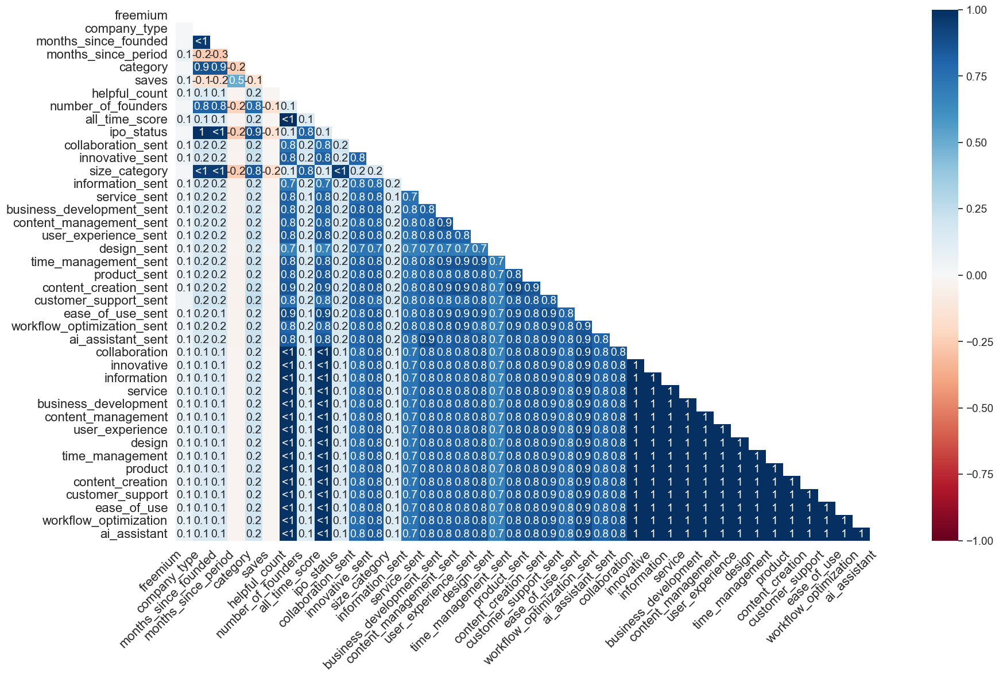

In [1999]:
# missing at random correlation map
#no possibility of removing digits

msno.heatmap(c)

In [2000]:

# Case 3: Apply SimpleImputer for features missing at random
simple_imp = SimpleImputer(strategy='median')
features_case_3 = ['likes', 'stars', 'all_time_score'] 
c[features_case_3] = simple_imp.fit_transform(c[features_case_3])

In [2001]:
# Case 1: Replace NaN with zero for features where missingness implies absence
for column in ['total_funding_amount', 'number_of_funding_rounds' , 'number_of_investors','amount_of_reviews', 'saves' ]: 
    c[column].fillna(0, inplace=True)


In [2002]:
# Case 2: Replace NaN with a new category for features where a default category is acceptable
new_category = 'no_category'
for column in ['freemium', 'ipo_status', 'company_type', 'size_category', 'output_type']:  # replace with actual column names
    c[column] = c[column].astype('category')  # Ensure the column has 'category' dtype
    c[column] = c[column].cat.add_categories(new_category)  # Add the new category to the categorical column
    c[column].fillna(new_category, inplace=True)

In [2003]:
# Case 5: Apply MICE for features not missing at random and not correlated with similar categories
mice_imp = IterativeImputer()
features_case_5 = [
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant']  # replace with actual column names
c[features_case_5] = mice_imp.fit_transform(c[features_case_5])


In [2004]:
c.head()

,tool_id,price_category,price,freemium,funding_stage,company_type,months_since_founded,months_since_period,average_visits,merged_months,category,hq_location,saves,likes,stars,helpful_count,number_of_founders,number_of_investors,number_of_funding_rounds,total_funding_amount,all_time_score,ipo_status,amount_of_reviews,collaboration_sent,innovative_sent,size_category,output_type,information_sent,service_sent,business_development_sent,content_management_sent,user_experience_sent,design_sent,time_management_sent,product_sent,content_creation_sent,customer_support_sent,ease_of_use_sent,workflow_optimization_sent,ai_assistant_sent,collaboration,innovative,information,service,business_development,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant
0,1471,1,39.000000,no_category,False,no_category,NaN,6.0,6.388561,6.0,NaN,False,3.0,2.4451,5.000000,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466
1,7978,3,859.098663,Yes,False,no_category,NaN,24.0,7.810353,24.0,NaN,False,14.0,2.4451,3.815774,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466
2,437,0,12.000000,Yes,False,no_category,NaN,5.0,4.867534,5.0,NaN,False,150.0,1.0000,5.000000,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466
3,128,0,6.000000,no_category,False,no_category,NaN,4.0,7.834392,4.0,NaN,False,43.0,2.4451,3.815774,0.0,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.417688,0.373669,no_category,undefined,0.303644,0.380847,0.317433,0.281961,0.505789,0.358416,0.500000,0.385959,0.408429,0.500000,0.408768,0.379678,0.330127,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000
4,4225,3,859.098663,no_category,False,no_category,NaN,9.0,7.538495,9.0,NaN,False,6.0,2.4451,3.815774,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466


In [2005]:
c.columns

Index(['tool_id', 'price_category', 'price', 'freemium', 'funding_stage',
       'company_type', 'months_since_founded', 'months_since_period',
       'average_visits', 'merged_months', 'category', 'hq_location', 'saves',
       'likes', 'stars', 'helpful_count', 'number_of_founders',
       'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'all_time_score', 'ipo_status',
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'size_category', 'output_type', 'information_sent', 'service_sent',
       'business_development_sent', 'content_management_sent',
       'user_experience_sent', 'design_sent', 'time_management_sent',
       'product_sent', 'content_creation_sent', 'customer_support_sent',
       'ease_of_use_sent', 'workflow_optimization_sent', 'ai_assistant_sent',
       'collaboration', 'innovative', 'information', 'service',
       'business_development', 'content_management', 'user_experience',
       'design', 'time_manage

####  <span style="color:green;font-weight:bold;">Feature 9: Founders</span>


In [2006]:
## Imputing number_of_founders, number_of_investors and number_of_employees and number_of_funding_rounds
KNN_impute_cols = ['number_of_founders', 'number_of_investors',  'all_time_score', 'number_of_funding_rounds', 'total_funding_amount']
df_KNN = c[KNN_impute_cols]

#No need to encode other variables as they are already numeric
df_KNN.head()

,number_of_founders,number_of_investors,all_time_score,number_of_funding_rounds,total_funding_amount
0,NaN,0.0,5.0,0.0,0.0
1,NaN,0.0,5.0,0.0,0.0
2,NaN,0.0,5.0,0.0,0.0
3,NaN,0.0,5.0,0.0,0.0
4,NaN,0.0,5.0,0.0,0.0


In [2007]:
#knn imputer import
from sklearn.impute import KNNImputer

In [2008]:
# which column is founders
print(df_KNN.columns.get_loc('number_of_founders'))

0


In [2009]:
# KNN imputing_founders
imputer = KNNImputer(n_neighbors=10)
# We know Production Budget was the 0th columns, therefore just fetching the imputed Production Budget values
founders = imputer.fit_transform(df_KNN)[:,0]
# Adding the imputed income values back in df in a new column
c['founders_imputed'] = founders
c.head()

,tool_id,price_category,price,freemium,funding_stage,company_type,months_since_founded,months_since_period,average_visits,merged_months,category,hq_location,saves,likes,stars,helpful_count,number_of_founders,number_of_investors,number_of_funding_rounds,total_funding_amount,all_time_score,ipo_status,amount_of_reviews,collaboration_sent,innovative_sent,size_category,output_type,information_sent,service_sent,business_development_sent,content_management_sent,user_experience_sent,design_sent,time_management_sent,product_sent,content_creation_sent,customer_support_sent,ease_of_use_sent,workflow_optimization_sent,ai_assistant_sent,collaboration,innovative,information,service,business_development,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant,founders_imputed
0,1471,1,39.000000,no_category,False,no_category,NaN,6.0,6.388561,6.0,NaN,False,3.0,2.4451,5.000000,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6
1,7978,3,859.098663,Yes,False,no_category,NaN,24.0,7.810353,24.0,NaN,False,14.0,2.4451,3.815774,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6
2,437,0,12.000000,Yes,False,no_category,NaN,5.0,4.867534,5.0,NaN,False,150.0,1.0000,5.000000,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6
3,128,0,6.000000,no_category,False,no_category,NaN,4.0,7.834392,4.0,NaN,False,43.0,2.4451,3.815774,0.0,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.417688,0.373669,no_category,undefined,0.303644,0.380847,0.317433,0.281961,0.505789,0.358416,0.500000,0.385959,0.408429,0.500000,0.408768,0.379678,0.330127,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,1.6
4,4225,3,859.098663,no_category,False,no_category,NaN,9.0,7.538495,9.0,NaN,False,6.0,2.4451,3.815774,NaN,NaN,0.0,0.0,0.0,5.0,no_category,0.0,0.260891,0.327161,no_category,undefined,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6


In [2010]:
#check the correlation between the imputed and original column with average cisits
c[['number_of_founders', 'founders_imputed', 'average_visits']].corr()


,number_of_founders,founders_imputed,average_visits
number_of_founders,1.000000,1.000000,0.132853
founders_imputed,1.000000,1.000000,0.176957
average_visits,0.132853,0.176957,1.000000


In [2011]:
c.isnull().sum()

tool_id                          0
price_category                   0
price                            0
freemium                         0
funding_stage                    0
company_type                     0
months_since_founded          4561
months_since_period            118
average_visits                   0
merged_months                    0
category                      4759
hq_location                      0
saves                            0
likes                            0
stars                            0
helpful_count                 5244
number_of_founders            4893
number_of_investors              0
number_of_funding_rounds         0
total_funding_amount             0
all_time_score                   0
ipo_status                       0
amount_of_reviews                0
collaboration_sent               0
innovative_sent                  0
size_category                    0
output_type                      0
information_sent                 0
service_sent        

In [2012]:
c.dtypes

tool_id                          int64
price_category                category
price                          float64
freemium                      category
funding_stage                     bool
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                  float64
category                      category
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
helpful_count                  float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
size_category            

In [2013]:
#delete sentiment per sentence
c = c.drop(['tool_id', 'category', 'helpful_count'], axis=1)


array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'months_since_founded'}>,
        <Axes: title={'center': 'months_since_period'}>,
        <Axes: title={'center': 'average_visits'}>,
        <Axes: title={'center': 'merged_months'}>,
        <Axes: title={'center': 'saves'}>,
        <Axes: title={'center': 'likes'}>],
       [<Axes: title={'center': 'stars'}>,
        <Axes: title={'center': 'number_of_founders'}>,
        <Axes: title={'center': 'number_of_investors'}>,
        <Axes: title={'center': 'number_of_funding_rounds'}>,
        <Axes: title={'center': 'total_funding_amount'}>,
        <Axes: title={'center': 'all_time_score'}>,
        <Axes: title={'center': 'amount_of_reviews'}>],
       [<Axes: title={'center': 'collaboration_sent'}>,
        <Axes: title={'center': 'innovative_sent'}>,
        <Axes: title={'center': 'information_sent'}>,
        <Axes: title={'center': 'service_sent'}>,
        <Axes: title={'center': 'business_development_s

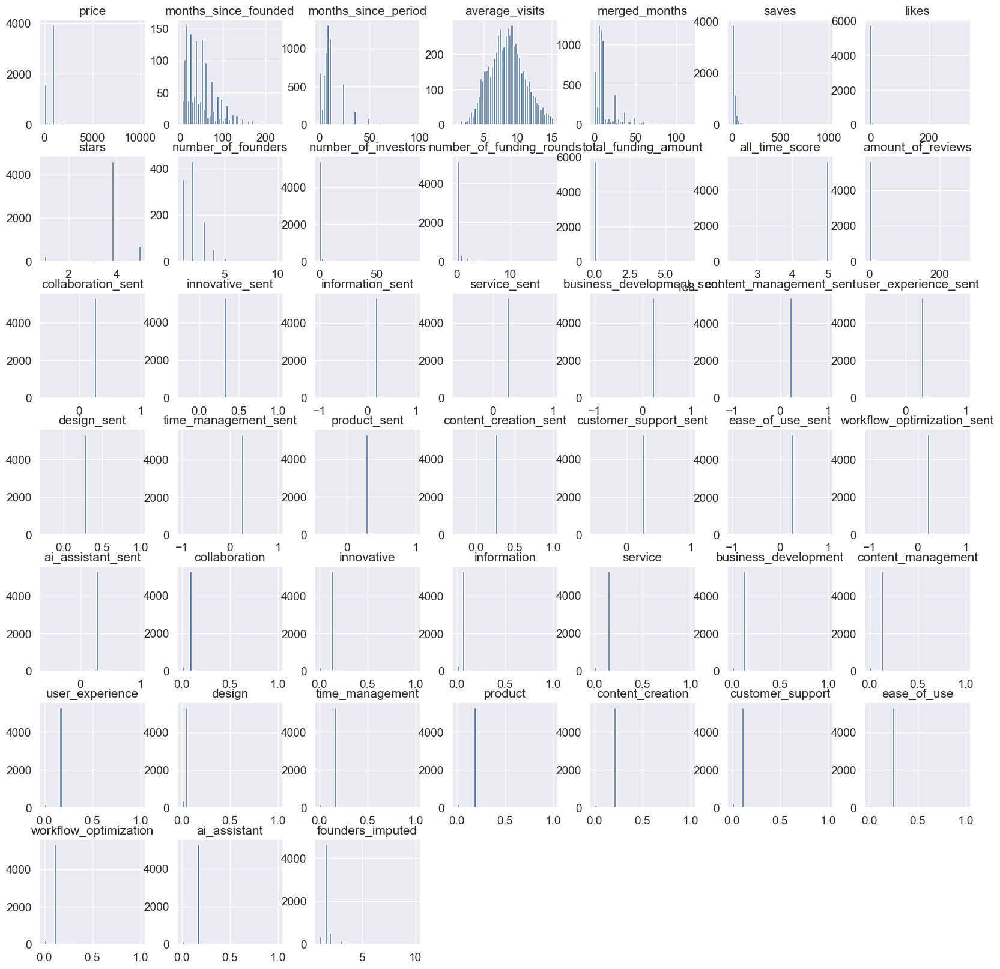

In [2014]:
#histogram of C
c.hist(figsize=(20, 20), bins=50)

## 6.3 Computing VIF

In [2015]:
c.dtypes

price_category                category
price                          float64
freemium                      category
funding_stage                     bool
company_type                  category
months_since_founded           float64
months_since_period            float64
average_visits                 float64
merged_months                  float64
hq_location                    boolean
saves                          float64
likes                          float64
stars                          float64
number_of_founders             float64
number_of_investors            float64
number_of_funding_rounds       float64
total_funding_amount           float64
all_time_score                 float64
ipo_status                    category
amount_of_reviews              float64
collaboration_sent             float64
innovative_sent                float64
size_category                 category
output_type                   category
information_sent               float64
service_sent             

In [2016]:
#create df_dummies rel_columns, drop last column

df_dummies = pd.get_dummies(c)

df_dummies.columns


Index(['price', 'funding_stage', 'months_since_founded', 'months_since_period',
       'average_visits', 'merged_months', 'hq_location', 'saves', 'likes',
       'stars', 'number_of_founders', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant', 'founders_imputed',
     

In [2017]:
dummy_features = ['price', 'funding_stage', 
        'merged_months', 'hq_location', 'saves', 'likes',
       'stars', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant', 'founders_imputed',
 'price_category_1', 'price_category_4',
       'price_category_3', 'freemium_No', 'freemium_Yes', 'size_category_medium', 'size_category_small',
        'output_type_creative output',
       'output_type_technical output',
]

In [2018]:
# Convert boolean columns to integers
for col in dummy_features:
        df_dummies[col] = pd.to_numeric(df_dummies[col], errors='coerce')


In [2019]:
# creating a dataframe for saving the VIF values
df_dummies[dummy_features] = df_dummies[dummy_features].apply(pd.to_numeric, errors='coerce')

In [2020]:
#df dummies
df_dummies.head()

,price,funding_stage,months_since_founded,months_since_period,average_visits,merged_months,hq_location,saves,likes,stars,number_of_founders,number_of_investors,number_of_funding_rounds,total_funding_amount,all_time_score,amount_of_reviews,collaboration_sent,innovative_sent,information_sent,service_sent,business_development_sent,content_management_sent,user_experience_sent,design_sent,time_management_sent,product_sent,content_creation_sent,customer_support_sent,ease_of_use_sent,workflow_optimization_sent,ai_assistant_sent,collaboration,innovative,information,service,business_development,content_management,user_experience,design,time_management,product,content_creation,customer_support,ease_of_use,workflow_optimization,ai_assistant,founders_imputed,price_category_0,price_category_1,price_category_2,price_category_3,price_category_4,freemium_No,freemium_Yes,freemium_no_category,company_type_For Profit,company_type_Non-profit,company_type_no_category,ipo_status_Private,ipo_status_Public,ipo_status_no_category,size_category_big,size_category_medium,size_category_small,size_category_no_category,output_type_creative output,output_type_technical output,output_type_undefined,output_type_no_category
0,39.000000,False,NaN,6.0,6.388561,6.0,False,3.0,2.4451,5.000000,NaN,0.0,0.0,0.0,5.0,0.0,0.260891,0.327161,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6,False,True,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,True,False
1,859.098663,False,NaN,24.0,7.810353,24.0,False,14.0,2.4451,3.815774,NaN,0.0,0.0,0.0,5.0,0.0,0.260891,0.327161,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False
2,12.000000,False,NaN,5.0,4.867534,5.0,False,150.0,1.0000,5.000000,NaN,0.0,0.0,0.0,5.0,0.0,0.260891,0.327161,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6,True,False,False,False,False,False,True,False,False,False,True,False,False,True,False,False,False,True,False,False,True,False
3,6.000000,False,NaN,4.0,7.834392,4.0,False,43.0,2.4451,3.815774,NaN,0.0,0.0,0.0,5.0,0.0,0.417688,0.373669,0.303644,0.380847,0.317433,0.281961,0.505789,0.358416,0.500000,0.385959,0.408429,0.500000,0.408768,0.379678,0.330127,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,1.6,True,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,True,False
4,859.098663,False,NaN,9.0,7.538495,9.0,False,6.0,2.4451,3.815774,NaN,0.0,0.0,0.0,5.0,0.0,0.260891,0.327161,0.184406,0.253409,0.225516,0.228198,0.275961,0.275724,0.266834,0.280928,0.274960,0.256028,0.274571,0.236384,0.289040,0.090248,0.13948,0.07723,0.151897,0.126964,0.13506,0.173087,0.050384,0.172074,0.188219,0.204892,0.113673,0.241778,0.108143,0.179466,1.6,False,False,False,True,False,False,False,True,False,False,True,False,False,True,False,False,False,True,False,False,True,False


In [2021]:
###################
## Computing VIF ##
###################
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np

# creating a dataframe for saving the VIF values
# Convert the input values to a supported numeric type
df_dummies[dummy_features] = df_dummies[dummy_features].astype(np.float64)

df_vif = pd.DataFrame()
df_vif["feature"] = dummy_features
# calculating VIF for each feature
vif = [variance_inflation_factor(df_dummies[dummy_features].values, i) for i in range(len(dummy_features))]
df_vif['vif'] = vif

df_vif.sort_values(by='vif')[:50]

,feature,vif
31,freemium_No,1.037211
1,funding_stage,1.114133
11,amount_of_reviews,1.125179
4,saves,1.256619
5,likes,1.310096
32,freemium_Yes,1.491224
28,price_category_1,1.529757
3,hq_location,1.607077
9,total_funding_amount,1.686214
29,price_category_4,2.382594


In [2022]:
df_dummies.dtypes

price                           float64
funding_stage                   float64
months_since_founded            float64
months_since_period             float64
average_visits                  float64
                                 ...   
size_category_no_category          bool
output_type_creative output     float64
output_type_technical output    float64
output_type_undefined              bool
output_type_no_category            bool
Length: 69, dtype: object

In [2023]:
# Create a list of feature names with VIF lower than 5
selected_features = ['price', 'funding_stage', 
        'merged_months', 'hq_location', 'saves', 'likes',
        'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 
       'amount_of_reviews', 
       'information', 
       'design', 
        'content_creation', 'customer_support', 
       'freemium_Yes',  'size_category_medium', 'size_category_small', 
        'output_type_creative output', 'output_type_technical output'
       
       
       ]


df_vif = pd.DataFrame()
df_vif["feature"] = selected_features
# calculating VIF for each feature
vif = [variance_inflation_factor(df_dummies[selected_features].values, i) for i in range(len(selected_features))]
df_vif['vif'] = vif

df_vif.sort_values(by='vif')[:50]

,feature,vif
9,amount_of_reviews,1.094229
1,funding_stage,1.111366
4,saves,1.229399
5,likes,1.291031
14,freemium_Yes,1.405119
3,hq_location,1.599075
8,total_funding_amount,1.681848
0,price,2.235537
6,number_of_investors,2.747702
18,output_type_technical output,2.777121


In [2024]:
#cor with average visits
correlation = df_dummies.corr()['average_visits'].sort_values(ascending=False)

#print correlation with average visits
print(correlation[:15])


average_visits                  1.000000
merged_months                   0.409276
months_since_founded            0.369187
company_type_For Profit         0.356754
ipo_status_Private              0.351138
size_category_medium            0.308513
number_of_funding_rounds        0.297703
months_since_period             0.290013
output_type_creative output     0.266618
number_of_investors             0.256096
hq_location                     0.235553
saves                           0.217674
amount_of_reviews               0.184255
founders_imputed                0.176957
output_type_technical output    0.175500
Name: average_visits, dtype: float64


A rule of thumb is that if  VIF > 10 then multicollinearity is high. A cutoff of 5 is generally used. 

## 6.4 Mediation of variables

In [2025]:
#code retrieved from ChatGPT(2024)

# ignore warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Dictionary to store the results
iv_mediator_pairs = {
    
    'collaboration': 'collaboration_sent',
    'innovative': 'innovative_sent',
    'information': 'information_sent',
    'service': 'service_sent',
    'business_development': 'business_development_sent',
    'content_management': 'content_management_sent',
    'user_experience': 'user_experience_sent',
    'design': 'design_sent',
    'time_management': 'time_management_sent',
    'product': 'product_sent',
    'content_creation': 'content_creation_sent',
    'customer_support': 'customer_support_sent',
    'ease_of_use': 'ease_of_use_sent',
    'workflow_optimization': 'workflow_optimization_sent',
    'ai_assistant': 'ai_assistant_sent',


}

# Je afhankelijke variabele
dependent_var = 'average_visits'  # Vervang DV door de daadwerkelijke naam van je afhankelijke variabele

# Loop door de dictionary en voer de mediatie-analyse uit voor elke IV-Mediator pairing
for iv, mediator in iv_mediator_pairs.items():
    print(f'Analyzing Mediation for IV: {iv} and Mediator: {mediator}\n')

    # Model 1: Mediator ~ IV
    model1 = smf.ols(formula=f'{mediator} ~ {iv}', data=c).fit()

    # Model 2: DV ~ IV
    model2 = smf.ols(formula=f'{dependent_var} ~ {iv}', data=c).fit()

    # Model 3: DV ~ IV + Mediator
    model3 = smf.ols(formula=f'{dependent_var} ~ {iv} + {mediator}', data=c).fit()

    # Print results
    print(f'Model 1: {mediator} ~ {iv}\n{model1.summary()}\n')
    print(f'Model 2: {dependent_var} ~ {iv}\n{model2.summary()}\n')
    print(f'Model 3: {dependent_var} ~ {iv} + {mediator}\n{model3.summary()}\n')

    # Check and print whether IV is significant in Model 1 and 2, and Mediator in Model 3
    iv_significant_m1_m2 = "Yes" if model1.pvalues[iv] < 0.05 and model2.pvalues[iv] < 0.05 else "No"
    mediator_significant_m3 = "Yes" if model3.pvalues[mediator] < 0.05 else "No"
    print(f"Is IV significant in Model 1 and 2? {iv_significant_m1_m2}")
    print(f"Is Mediator significant in Model 3? {mediator_significant_m3}")

    # Check if the impact of IV on DV decreases when the Mediator is included in Model 3
    impact_decreases = "Yes" if abs(model3.params[iv]) < abs(model2.params[iv]) else "No"
    print(f"Does the impact of IV on DV decrease in Model 3 compared to Model 2? {impact_decreases}")

    print("\n------------------------------------------------\n")

Analyzing Mediation for IV: collaboration and Mediator: collaboration_sent

Model 1: collaboration_sent ~ collaboration
                            OLS Regression Results                            
Dep. Variable:     collaboration_sent   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     40.51
Date:                Wed, 28 Feb 2024   Prob (F-statistic):           2.10e-10
Time:                        13:08:32   Log-Likelihood:                 7918.3
No. Observations:                5917   AIC:                        -1.583e+04
Df Residuals:                    5915   BIC:                        -1.582e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
--------

## 6.5 Linearity check



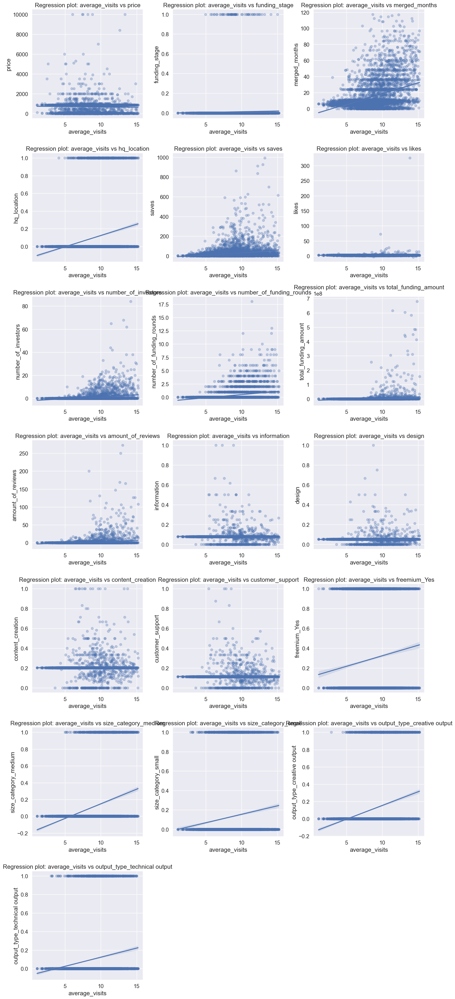

In [2026]:

# Features to check for linearity with 'average_visits'

# The target
compare_feature = 'average_visits'

# Calculate the number of rows needed in the subplot grid
n_features = len(selected_features)
n_cols = 3
n_rows = ceil(n_features / n_cols)

# Create a figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()  # Flatten to 1D array for easy iteration

# Loop through features and create regplots
for i, feature in enumerate(selected_features):
    sns.regplot(x=compare_feature, y=feature, data=df_dummies, ax=axes[i], scatter_kws={'alpha':0.3})
    axes[i].set_title(f'Regression plot: {compare_feature} vs {feature}')
    axes[i].set_ylabel(feature)
    axes[i].set_xlabel(compare_feature)

# Remove any empty plots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# 7.  Scaling & Test/Train Split


**Train-Test Split**
We divide the original dataset randomly into 80/20 split. 
- *Training dataset*: 80% of the original dataset is used to train the ML model. Traning means estimating the model parameters.
- *Test dataset*: 20% of the original dataset is used to test the trained ML model's peformance.

Code is retrieved from:.


ChatGPT. (2024). https://chat.openai.com/

Bhaumik, D & Dey, D (2023). BrightSpace. Linear-Logistic Regression.ipynb  from AI methods course


In [2027]:
df_dummies[selected_features].columns

Index(['price', 'funding_stage', 'merged_months', 'hq_location', 'saves',
       'likes', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'amount_of_reviews', 'information', 'design',
       'content_creation', 'customer_support', 'freemium_Yes',
       'size_category_medium', 'size_category_small',
       'output_type_creative output', 'output_type_technical output'],
      dtype='object')

In [2028]:
# final fatures including target
dummy_features = ['price', 'funding_stage', 'merged_months', 'hq_location', 'saves',
       'likes', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'amount_of_reviews', 'information', 'design',
       'content_creation', 'customer_support', 'freemium_Yes',
       'size_category_big', 'size_category_medium', 'size_category_small',
       'output_type_creative output', 'output_type_technical output',
 'average_visits'
       ]

array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'funding_stage'}>,
        <Axes: title={'center': 'merged_months'}>,
        <Axes: title={'center': 'hq_location'}>],
       [<Axes: title={'center': 'saves'}>,
        <Axes: title={'center': 'likes'}>,
        <Axes: title={'center': 'number_of_investors'}>,
        <Axes: title={'center': 'number_of_funding_rounds'}>],
       [<Axes: title={'center': 'total_funding_amount'}>,
        <Axes: title={'center': 'amount_of_reviews'}>,
        <Axes: title={'center': 'information'}>,
        <Axes: title={'center': 'design'}>],
       [<Axes: title={'center': 'content_creation'}>,
        <Axes: title={'center': 'customer_support'}>,
        <Axes: title={'center': 'freemium_Yes'}>,
        <Axes: title={'center': 'size_category_medium'}>],
       [<Axes: title={'center': 'size_category_small'}>,
        <Axes: title={'center': 'output_type_creative output'}>,
        <Axes: title={'center': 'output_type_technica

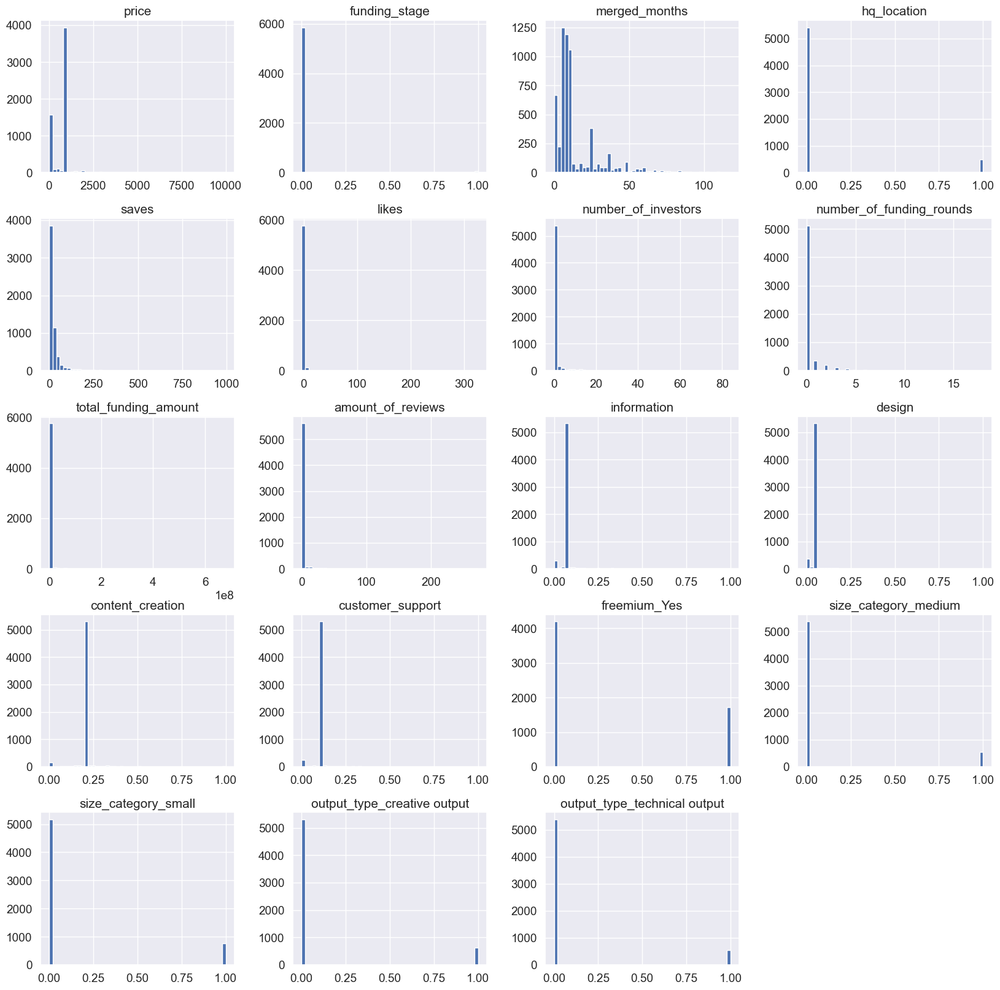

In [2029]:
#check distrbution of ivs
df_dummies[selected_features].hist(figsize=(20, 20), bins=50)


In [2030]:

# Apply Yeo-Johnson transformation to selected columns
df_dummies['saves'], _ = yeojohnson(df_dummies['saves'])
df_dummies['likes'], _ = yeojohnson(df_dummies['likes'])
df_dummies['total_funding_amount'], _ = yeojohnson(df_dummies['total_funding_amount'])
df_dummies['amount_of_reviews'], _ = yeojohnson(df_dummies['amount_of_reviews'])
df_dummies['merged_months'], _ = yeojohnson(df_dummies['merged_months'])

#information design 
df_dummies['information'], _ = yeojohnson(df_dummies['information'])
df_dummies['design'], _ = yeojohnson(df_dummies['design'])
df_dummies['content_creation'], _ = yeojohnson(df_dummies['content_creation'])
df_dummies['customer_support'], _ = yeojohnson(df_dummies['customer_support'])
#price
df_dummies['price'], _ = yeojohnson(df_dummies['price'])



array([[<Axes: title={'center': 'price'}>,
        <Axes: title={'center': 'funding_stage'}>,
        <Axes: title={'center': 'merged_months'}>,
        <Axes: title={'center': 'hq_location'}>],
       [<Axes: title={'center': 'saves'}>,
        <Axes: title={'center': 'likes'}>,
        <Axes: title={'center': 'number_of_investors'}>,
        <Axes: title={'center': 'number_of_funding_rounds'}>],
       [<Axes: title={'center': 'total_funding_amount'}>,
        <Axes: title={'center': 'amount_of_reviews'}>,
        <Axes: title={'center': 'information'}>,
        <Axes: title={'center': 'design'}>],
       [<Axes: title={'center': 'content_creation'}>,
        <Axes: title={'center': 'customer_support'}>,
        <Axes: title={'center': 'freemium_Yes'}>,
        <Axes: title={'center': 'size_category_medium'}>],
       [<Axes: title={'center': 'size_category_small'}>,
        <Axes: title={'center': 'output_type_creative output'}>,
        <Axes: title={'center': 'output_type_technica

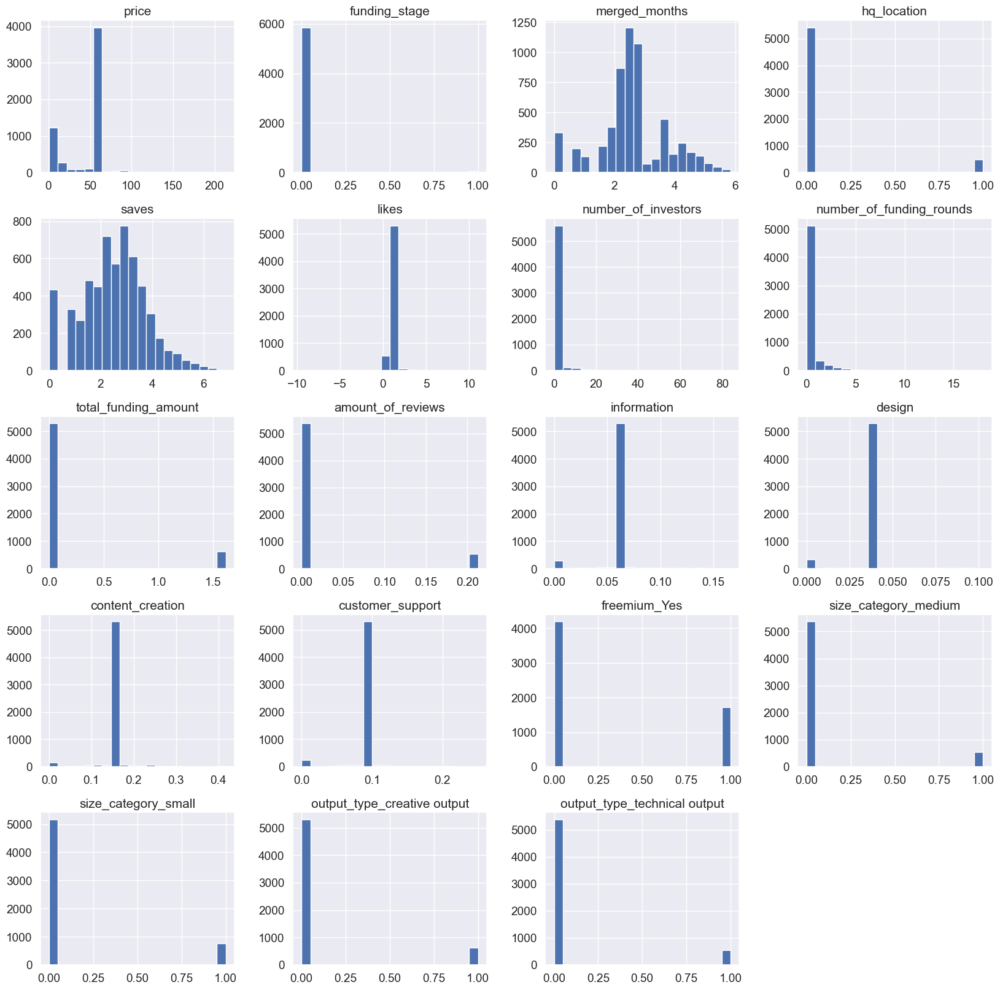

In [2031]:
#plot distribution of every feature in df log transformed
df_dummies[selected_features].hist(figsize=(20, 20), bins=20)

In [2032]:
######################
## Train-Test split ##
######################
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df_dummies[dummy_features], test_size=0.2, random_state = 1009) 

X_train = df_train[selected_features] 
y_train = df_train['average_visits']
X_test = df_test[selected_features] 
y_test = df_test['average_visits']


In [2033]:
#StandardScaler usage
from sklearn.preprocessing import StandardScaler

# define standard scaler instance
scaler = StandardScaler()

# Fitting the StandardScaler to X_train
scaler.fit(X_train)

# Scaling X_train used the fitting StandardScaler to the traning dataset
X_train_scaled = scaler.transform(X_train)

# transforming X_train_scaled to pandas dataframe
df_X_train_scaled = pd.DataFrame(X_train_scaled, columns=selected_features)

# IMPORTANT: To scale X_test use the StandardScaler fitted to the traning dataset. The scaled X_test will only be used for model assessment!
# NOTE: DO not fit the StandardScaler to the test dataset. If you do then you are using information from the test dataset and will bias your model.
# Test datset is sacred, any properties from the test dataset SHOULD NOT be used.
X_test_scaled = scaler.transform(X_test)
# transforming X_test_scaled to pandas dataframe
df_X_test_scaled = pd.DataFrame(X_test_scaled, columns=selected_features)

# 8. Regression analysis

Code is retrieved from:
ChatGPT. (2024). https://chat.openai.com/

Bhaumik, D & Dey, D (2023). BrightSpace. Linear-Logistic Regression.ipynb  from AI methods course



The following approach for building the MLR model based on the target sales is chosen:
1.	The correlations for the numerical and categorical variables on the dependent variable is checked and preliminary analysis of feature selection will be done.
2.	A test on multicollinearity is performed on a variables and variables with less than a VIF (variance inflation factor) of 5 are chosen.
3.	A univariate linear regression is built for all independent variables listed in Appendix and all significant predictors are chosen.
4.	A multiple regression linear regression is built with the variables selected from the previous step and predictors that are significant will remain in the model.
5.	The assumptions of the linear regression model are tested.
6.	The final MLR model is built with the remaining significant variables. To assess the model fit the McFadden R2 is computed.
7.	The MSE, MAE, RMSE and Adjusted R2 is computed to determine the predictive power of the model.


## 8.1 Linear regression

### Model training

First we will train univariate linear regression models to assess statistical significance.

In [2034]:
#Code retrieved from statsmodels documentation (2024)

# Load the data
data = df_dummies[dummy_features]
target = 'average_visits'

univariate_summaries = {}

# Test each feature separately
for feature in selected_features:
    # Define X and y for each feature
    X_uni = sm.add_constant(data[[feature]])
    y = data[target]

    # Fit the model
    model_uni = sm.OLS(y, X_uni)
    results_uni = model_uni.fit()

    # Save the summary for each feature
    univariate_summaries[feature] = results_uni.summary()

# Print summaries for each univariate model
for feature, summary in univariate_summaries.items():
    print(f"Summary for {feature}:\n{summary}\n\n")

Summary for price:
                            OLS Regression Results                            
Dep. Variable:         average_visits   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     8.275
Date:                Wed, 28 Feb 2024   Prob (F-statistic):            0.00403
Time:                        13:08:49   Log-Likelihood:                -13981.
No. Observations:                5917   AIC:                         2.797e+04
Df Residuals:                    5915   BIC:                         2.798e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.6202      0.071 

Kept the following the following variables because they are signifant and have no conditional error:
'price',  'merged_months', 'hq_location', 'saves',
'number_of_investors',  'total_funding_amount',
'amount_of_reviews', 'freemium_Yes',
'size_category_big', 'size_category_medium', 
'size_category_small',
'output_type_creative output'

In [2035]:
df_dummies[selected_features].columns

Index(['price', 'funding_stage', 'merged_months', 'hq_location', 'saves',
       'likes', 'number_of_investors', 'number_of_funding_rounds',
       'total_funding_amount', 'amount_of_reviews', 'information', 'design',
       'content_creation', 'customer_support', 'freemium_Yes',
       'size_category_medium', 'size_category_small',
       'output_type_creative output', 'output_type_technical output'],
      dtype='object')

In [2036]:
# Create a list of feature names with VIF lower than 5
multivariate_features = ['price',  'merged_months', 'hq_location', 'saves',
       'number_of_investors', 
       'total_funding_amount', 'amount_of_reviews',
      'freemium_Yes',
       'size_category_big', 'size_category_medium', 'size_category_small',
       'output_type_creative output']

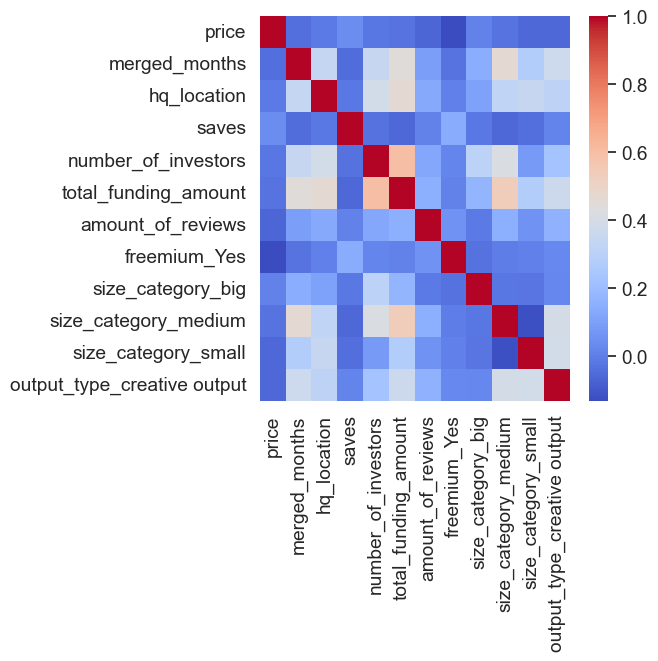

In [2037]:

# Increase the size of the heatmap
plt.figure(figsize=(5, 5))

#corr map
sns.heatmap(df_dummies[multivariate_features].corr(), cmap='coolwarm')

plt.show()

## 8.2 Multiple linear regression

In this part we will train 4 linear regression models:
- Using all the variables 
- Using HC3 robust standard errors
- Using Lasso regularization
- Using Ridge-regularization method (https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html#sklearn.linear_model.Ridge).

In [2038]:
multivariate_features2 = [  'merged_months', 'hq_location', 'saves',
       'number_of_investors', 
       'total_funding_amount', 'amount_of_reviews',
      'freemium_Yes',
      'size_category_medium', 'size_category_small',
       'output_type_creative output'      
       ]

In [2039]:
######################
## Train-Test split ##
######################
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df_dummies, test_size=0.2, random_state = 1009) 

X_train2 = df_train[multivariate_features2] 
y_train2 = df_train['average_visits']
X_test2 = df_test[multivariate_features2] 
y_test2 = df_test['average_visits']


In [2040]:
# Code retrieved from Bhaumik (2023)

# Assume 'df_dummies' is your original DataFrame and 'multivariate_features2' is a list of feature names

# Splitting the DataFrame into training and testing sets
df_train, df_test = train_test_split(df_dummies, test_size=0.2, random_state=1009)

# Selecting features and target for training and testing sets
X_train2 = df_train[multivariate_features2]
y_train2 = df_train['average_visits']
X_test2 = df_test[multivariate_features2]
y_test2 = df_test['average_visits']

# Initializing the StandardScaler
scaler = StandardScaler()

# Fitting the scaler to the training features and transforming them
scaler.fit(X_train2)
X_train_scaled2 = scaler.transform(X_train2)

# Converting the scaled training features back to a DataFrame with the original column names
df_X_train_scaled2 = pd.DataFrame(X_train_scaled2, columns=X_train2.columns)

# Transforming the testing features using the same scaler
X_test_scaled2 = scaler.transform(X_test2)

# Converting the scaled testing features back to a DataFrame with the original column names
df_X_test_scaled2 = pd.DataFrame(X_test_scaled2, columns=X_test2.columns)

# Now, 'df_X_train_scaled2' and 'df_X_test_scaled2' can be used for regression with column names preserved

In [2041]:
# Code retrieved from Bhaumik (2023)

#import lasso
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

# Gewone Lineaire Regressie met alle variabelen
model_ols = sm.OLS(y_train2, sm.add_constant(X_train_scaled2)).fit()
print("Ordinary Linear Regression fitted using all the feature variables")
print(f"R-2 value on training data: {model_ols.rsquared}")
print('-------------------------------------------------------------------------')

# Gewone Lineaire Regressie met alle variabelen en robuste standaardfouten (HC3)
model_ols_hc3 = sm.OLS(y_train2, sm.add_constant(X_train_scaled2)).fit(cov_type='HC3')
print("Ordinary Linear Regression with HC3 robust standard errors")
print(f"R-2 value on training data: {model_ols_hc3.rsquared}")
print('-------------------------------------------------------------------------')

# Lasso Regressie met alle variabelen
lasso_regressor = Lasso(alpha=0.4).fit(X_train_scaled2, y_train2)
print("Lasso Regression Model fitted using all the feature variables")
print(f"R-2 value on training data: {lasso_regressor.score(X_train_scaled2, y_train2)}")
print('-------------------------------------------------------------------------')

# Ridge Regressie met alle variabelen
ridge_regressor = Ridge(alpha=1).fit(X_train_scaled2, y_train2)
print("Ridge Regression Model fitted using all the feature variables")
print(f"R-2 value on training data: {ridge_regressor.score(X_train_scaled2, y_train2)}")
print('-------------------------------------------------------------------------')


Ordinary Linear Regression fitted using all the feature variables
R-2 value on training data: 0.28198697473213996
-------------------------------------------------------------------------
Ordinary Linear Regression with HC3 robust standard errors
R-2 value on training data: 0.28198697473213996
-------------------------------------------------------------------------
Lasso Regression Model fitted using all the feature variables
R-2 value on training data: 0.18530771496613685
-------------------------------------------------------------------------
Ridge Regression Model fitted using all the feature variables
R-2 value on training data: 0.28198696665132184
-------------------------------------------------------------------------


In [2042]:
# Code retrieved from Bhaumik (2023)

df_X_train_scaled2.reset_index(drop=True, inplace=True)
y_train2.reset_index(drop=True, inplace=True)

# Add a constant to the scaled DataFrame
df_X_train_scaled2_with_const = sm.add_constant(df_X_train_scaled2)

# Fit the OLS model with HC3 robust standard errors
model_ols_hc3 = sm.OLS(y_train2, df_X_train_scaled2_with_const).fit(cov_type='HC3')

print("Ordinary Linear Regression with HC3 robust standard errors")
print(model_ols_hc3.summary())

Ordinary Linear Regression with HC3 robust standard errors
                            OLS Regression Results                            
Dep. Variable:         average_visits   R-squared:                       0.282
Model:                            OLS   Adj. R-squared:                  0.280
Method:                 Least Squares   F-statistic:                     201.0
Date:                Wed, 28 Feb 2024   Prob (F-statistic):               0.00
Time:                        13:08:50   Log-Likelihood:                -10425.
No. Observations:                4733   AIC:                         2.087e+04
Df Residuals:                    4722   BIC:                         2.094e+04
Df Model:                          10                                         
Covariance Type:                  HC3                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------

In [2043]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
import numpy as np
import statsmodels.api as sm

# Assuming X_train_scaled2 and X_test_scaled2 have been scaled and are ready for use
# Combining the scaled training and test datasets
X_full_scaled = np.vstack((X_train_scaled2, X_test_scaled2))
# Adding a constant term for the intercept
X_full_scaled_const = sm.add_constant(X_full_scaled)

# Combining the training and test target variables
y_full = np.concatenate((y_train2, y_test2))

# Initialize the linear regression model
model_ols_hc3_cv = LinearRegression()

# Define the number of folds for cross-validation
n_folds = 5

# Perform cross-validation for various metrics
mae_cv = -cross_val_score(model_ols_hc3_cv, X_full_scaled_const, y_full, scoring='neg_mean_absolute_error', cv=n_folds)
mse_cv = -cross_val_score(model_ols_hc3_cv, X_full_scaled_const, y_full, scoring='neg_mean_squared_error', cv=n_folds)
rmse_cv = np.sqrt(-cross_val_score(model_ols_hc3_cv, X_full_scaled_const, y_full, scoring='neg_mean_squared_error', cv=n_folds))
r2_cv = cross_val_score(model_ols_hc3_cv, X_full_scaled_const, y_full, scoring='r2', cv=n_folds)
neg_mse_cv = -cross_val_score(model_ols_hc3_cv, X_full_scaled_const, y_full, scoring='neg_mean_squared_error', cv=n_folds)

# Print the results
print('-------------------------------------------------------------------------')
print('Cross-Validation Metrics for Linear Regression Model')
print(f'MAE (mean across folds): {mae_cv.mean():.3f} ± {mae_cv.std():.3f}')
print(f'MSE (mean across folds): {mse_cv.mean():.3f} ± {mse_cv.std():.3f}')
print(f'RMSE (mean across folds): {rmse_cv.mean():.3f} ± {rmse_cv.std():.3f}')
print(f'R-2 (mean across folds): {r2_cv.mean():.3f} ± {r2_cv.std():.3f}')
print(f'Negative MSE (mean across folds): {neg_mse_cv.mean():.3f} ± {neg_mse_cv.std():.3f}')
print('-------------------------------------------------------------------------')


-------------------------------------------------------------------------
Cross-Validation Metrics for Linear Regression Model
MAE (mean across folds): 1.748 ± 0.039
MSE (mean across folds): 4.753 ± 0.169
RMSE (mean across folds): 2.180 ± 0.039
R-2 (mean across folds): 0.280 ± 0.014
Negative MSE (mean across folds): 4.753 ± 0.169
-------------------------------------------------------------------------


## 8.3 Testing assumptions for regression

The four key assumptions for multiple linear regression, often summarized as "LINE" (Penn State Science, 2018), are:
•	Linearity: The relationship between the predictors and the mean of the response is linear. This means that changes in the predictors are associated with proportional changes in the expected value of the response.
•	Independence: The residuals (errors) of the model are independent of each other. In other words, the behavior of one error does not influence or predict the behavior of another.
•	Normality: The residuals follow a normal distribution. This assumption means that most of the errors are small and close to zero, with only a few larger in either direction (positive or negative).
•	Equal Variance: The residuals have constant variance at every level of the predictor variables. This implies that the spread of the residuals should be roughly the same across all levels of the independent variables.

To ensure these conditions are met in a multiple linear regression model, it is necessary to evaluate the residuals—the differences between the observed values and the values predicted by the model. If the residuals display these four characteristics, the model is considered appropriate for the data (Penn State Science, 2018).

In summary, these assumptions about the error term in linear regression models are crucial for ensuring that the model provides reliable and unbiased predictions. They underpin the statistical properties that allow us to make inferences and predictions with a known level of confidence.

### Assumption 1: Error term is a random variable

In [2044]:
# Use the model to make predictions on the training data
y_predicted = model_ols_hc3.predict(df_X_train_scaled2_with_const)

# Calculate the residuals by subtracting the predicted values from the actual values
residuals = y_train2 - y_predicted

# Calculate the mean of these residuals
mean_residuals = np.mean(residuals)

print("Mean of residuals:", mean_residuals)


Mean of residuals: 2.6722291773779384e-16


The mean of residuals being close to zero (in the range of e-16, which is a very small number close to zero) suggests that, on average, your models do not systematically overestimate or underestimate the target variable (average_visits). This aligns with the assumption that the expected value of the error term (residuals) in a linear regression model should be zero.

### Assumption 2: Homoscedasity

Breusch Pagan test p-value for OLS HC3 Model: 2.5698113451861163e-15


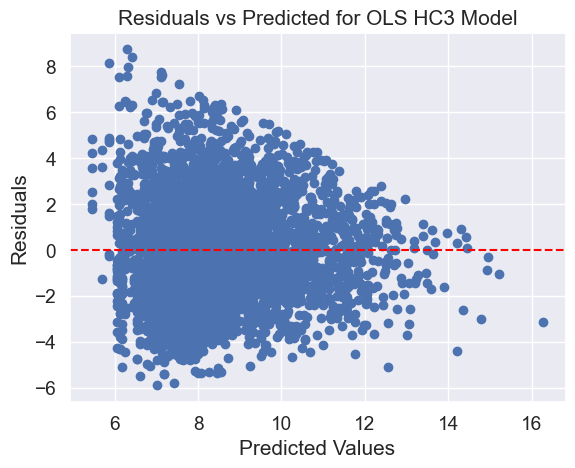

In [2045]:
# Code retrieved from ChatGPT (2023)

# Breusch-Pagan Test
_, pval_ols_hc3, _, _ = het_breuschpagan(model_ols_hc3.resid, model_ols_hc3.model.exog)
print(f"Breusch Pagan test p-value for OLS HC3 Model: {pval_ols_hc3}")

# Residuen vs Voorspelde Waarden Plot
plt.scatter(model_ols_hc3.fittedvalues, model_ols_hc3.resid)
plt.axhline(y=0, color='red', linestyle='dashed')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted for OLS HC3 Model')
plt.show()


The Breusch-Pagan test results indicate that heteroscedasticity is present in the residuals.

The test does not reject the null hypothesis of homoscedasticity, as indicated by p-values well below the 0.05 threshold. This implies that the variance of the residuals for these features is not stable and does significantly vary with the level of the independent variables.
 

### Assumption 3: Independence of Residuals

In [2046]:
#durbin watson
from statsmodels.stats.stattools import durbin_watson

# Durbin-Watson Test
dw_stat_ols_hc3 = durbin_watson(model_ols_hc3.resid)
print(f"Durbin-Watson Statistic for OLS HC3 Model: {dw_stat_ols_hc3}")



Durbin-Watson Statistic for OLS HC3 Model: 1.9866544968332005


The Durbin-Watson statistic is employed to detect the presence of autocorrelation in the residuals of a regression model, with a value around 2.0 suggesting no autocorrelation. This implies that the assumption of independence of errors holds for this model, which is critical for the validity of the OLS regression results.

### Assumption 4: Normality of Residuals

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


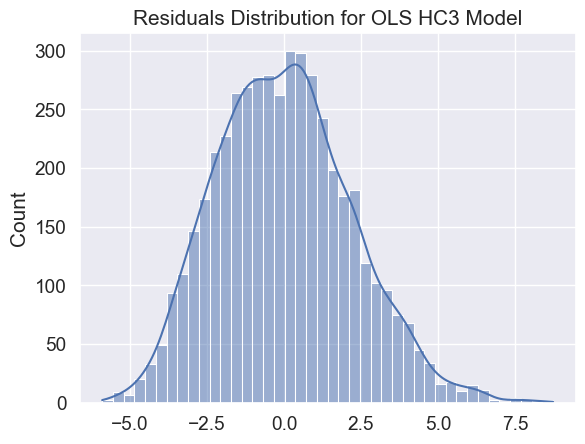

In [2047]:
#show resdials distrbution
sns.histplot(model_ols_hc3.resid, kde=True)
plt.title('Residuals Distribution for OLS HC3 Model')
plt.show()

Residuals have normal distribution

## 8.4  MLR on test set

In [2048]:
# get the predictions on the train dataset from the 3 models
y_train_pred_1 = model_ols_hc3.predict(sm.add_constant(X_train_scaled2))

# get the predictions on the test dataset from the 3 models
y_test_pred_1 = model_ols_hc3.predict(sm.add_constant(X_test_scaled2))

# Import all the necessary model evaluation metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
print('-------------------------------------------------------------------------')
print('Metrics for model 1, linear regression with all variables')
print('MAE train: %.3f, MAE test: %.3f' % (mean_absolute_error(y_train2, y_train_pred_1), mean_absolute_error(y_test2, y_test_pred_1)))
print('MSE train: %.3f, MSE test: %.3f' % (mean_squared_error(y_train2, y_train_pred_1), mean_squared_error(y_test2, y_test_pred_1)))
print('RMSE train: %.3f, RMSE test: %.3f' % (np.sqrt(mean_squared_error(y_train2, y_train_pred_1)), np.sqrt(mean_squared_error(y_test2, y_test_pred_1))))
print('R-2 train: %.3f, R-2 test: %.3f' % (r2_score(y_train2, y_train_pred_1), r2_score(y_test2, y_test_pred_1)))
print('-------------------------------------------------------------------------')

-------------------------------------------------------------------------
Metrics for model 1, linear regression with all variables
MAE train: 1.760, MAE test: 1.691
MSE train: 4.794, MSE test: 4.541
RMSE train: 2.190, RMSE test: 2.131
R-2 train: 0.282, R-2 test: 0.286
-------------------------------------------------------------------------


# 9. Extreme Gradient Boosting Regressor algorithm

Code is retried from the follwing sources:.

Developers XGB (2022). https://xgboost.readthedocs.io/en/stable/

Connor Tan (n.d.). Github. https://github.com/shap/shap

Scott Lundberg (2018). https://shap.readthedocs.io/en/latest/

## XGB Model 1

### on same dataset as linear regression

#### Hyperparameter tuning

In [2049]:

X_train = X_train2[multivariate_features2]
y_train = y_train2

# XGBoost Model Training
## XGBoost is an efficient and scalable implementation of gradient boosting that can be used for regression and classification problems.
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror') # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    'min_child_weight': [1, 2, 3],
    'subsample': [0.6, 0.8],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_lambda': [0, 2],
    'reg_alpha': [0, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=2, n_jobs=8, verbose=2)
grid_search.fit(X_train, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_) 
print("Refit time: ", grid_search.refit_time_)


Fitting 2 folds for each of 7776 candidates, totalling 15552 fits


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0.2, reg_lambda=0, 

**Best parameters are:**

Best parameters:  {'colsample_bytree': 0.7, 'gamma': 0.1, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 600, 'reg_alpha': 0, 'reg_lambda': 0, 'subsample': 0.6}


#### Model building 

Training Set RMSE: 1.9677633781589614
Test Set RMSE: 1.9605359793746666
Training Set MAPE: 22.27420364250095
Test Set MAPE: 21.72477796043972
Training Set Mean Squared Error: 3.872092712423568
Test Set Mean Squared Error: 3.843701326422583
Baseline Model Mean Squared Error: 6.360677624512947
Training Set R^2 Score: 0.42010190431285876
Test Set R^2 Score: 0.3953093649564585
Training Set Mean Absolute Error: 1.5731390626813777
Test Set Mean Absolute Error: 1.5677701423490058
Cross-validation scores (neg MSE): [-4.19308803 -4.01244416 -3.94870673 -3.94172225 -4.30153698]
Average Cross-validation score (MSE): 4.07949962883791
Model Complexity - number of features: 10
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': 0.1, 'grow_policy': None, 'impo

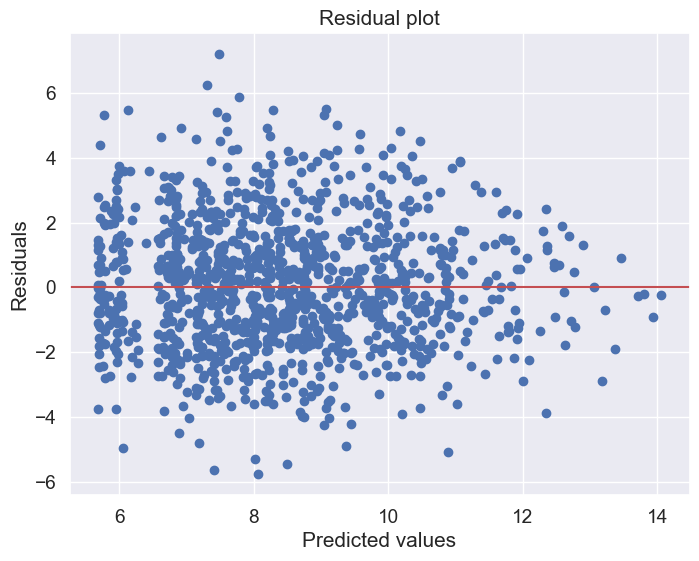

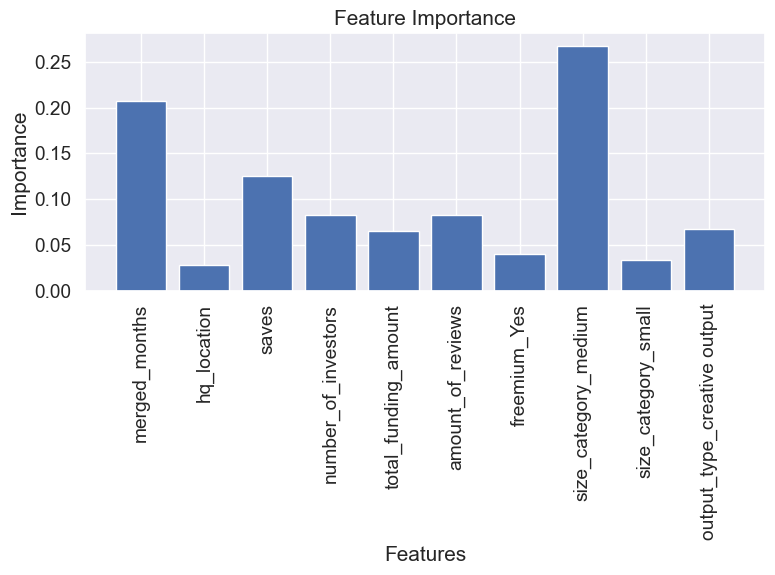

In [2050]:

X_train2 = X_train2[multivariate_features2]

# Train  XGBoost-model
xgb_model = XGBRegressor(random_state=42, max_depth= 3, n_estimators = 600, colsample_bytree = 0.7, gamma = 0.1, learning_rate = 0.01, min_child_weight = 1, reg_alpha = 0, reg_lambda = 0, subsample = 0.6) 
xgb_model.fit(X_train2, y_train2)

# predictions
y_pred_train = xgb_model.predict(X_train2)
y_pred_test = xgb_model.predict(X_test2)

# standard baseline model
dummy_regressor = DummyRegressor(strategy='mean')
dummy_regressor.fit(X_train2, y_train2)
y_dummy_pred = dummy_regressor.predict(X_test2)

# Model evaluation
mse_train = mean_squared_error(y_train2, y_pred_train)
mse_test = mean_squared_error(y_test2, y_pred_test)
r2_train = r2_score(y_train2, y_pred_train)
r2_test = r2_score(y_test2, y_pred_test)
mae_train = mean_absolute_error(y_train2, y_pred_train)
mae_test = mean_absolute_error(y_test2, y_pred_test)
mse_dummy = mean_squared_error(y_test2, y_dummy_pred)

rmse_train = np.sqrt(mean_squared_error(y_train2, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_test2, y_pred_test))


mape_train = np.mean(np.abs((y_train2 - y_pred_train) / y_train2)) * 100
mape_test = np.mean(np.abs((y_test2 - y_pred_test) / y_test2)) * 100

print("Training Set RMSE:", rmse_train)
print("Test Set RMSE:", rmse_test)
print("Training Set MAPE:", mape_train)
print("Test Set MAPE:", mape_test)
print("Training Set Mean Squared Error:", mse_train)
print("Test Set Mean Squared Error:", mse_test)
print("Baseline Model Mean Squared Error:", mse_dummy)
print("Training Set R^2 Score:", r2_train)
print("Test Set R^2 Score:", r2_test)
print("Training Set Mean Absolute Error:", mae_train)
print("Test Set Mean Absolute Error:", mae_test)


# Cross-validation for 
cv_scores = cross_val_score(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error')
print("Cross-validation scores (neg MSE):", cv_scores)
print("Average Cross-validation score (MSE):", -np.mean(cv_scores))

# Modelcomplexity
print("Model Complexity - number of features:", X_train2.shape[1])
print(xgb_model.get_params())

# residualanalaysis
residuals = y_test2 - y_pred_test
plt.figure(figsize=(8,6))
plt.scatter(y_pred_test, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.title('Residual plot')
plt.show()



# model interpretation
feature_importance = xgb_model.feature_importances_
features = X_train2.columns

plt.figure(figsize=(8, 6))
plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance')
plt.tight_layout()  
plt.show()

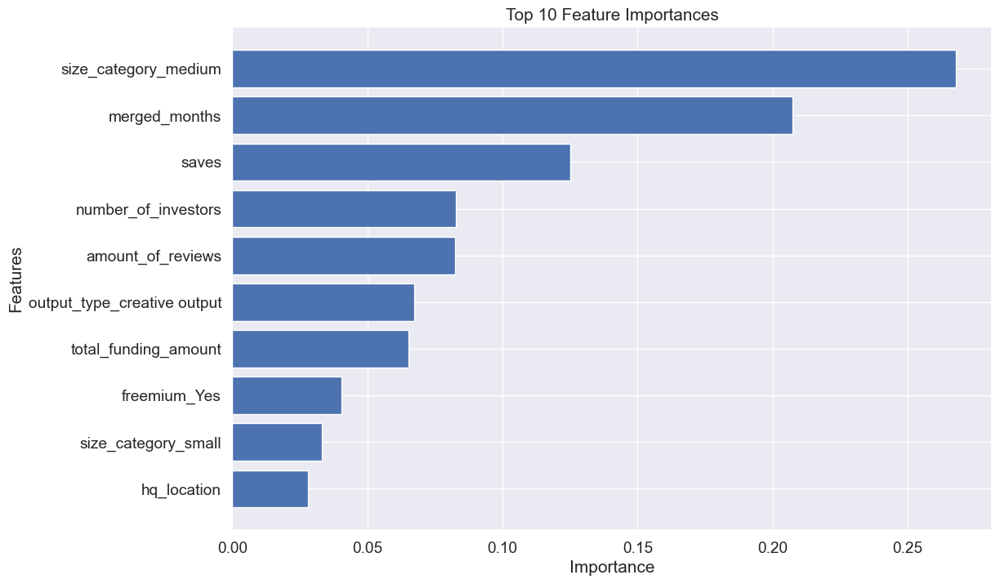

In [2051]:
# Get feature importances
feature_importances = xgb_model.feature_importances_

# Get the feature names
features = X_train2.columns

# Map feature importances to the features
feature_importance_dict = dict(zip(features, feature_importances))

# Sort the feature importances in descending order
sorted_features = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)

# Select the top 10 features
top_features = sorted_features[:10]
feature_names = [item[0] for item in top_features]
feature_scores = [item[1] for item in top_features]

# Plotting
plt.figure(figsize=(12, 8))
plt.barh(feature_names, feature_scores)
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Top 10 Feature Importances')
plt.gca().invert_yaxis()  # To display the highest importance at the top
plt.show()

In [2052]:
# compute SHAP values
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_train2)

# visualize the first prediction's explanation
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X_train2.iloc[0,:])

unclosed file <_io.BufferedReader name='/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/tmplotfdhzs/model.ubj'>


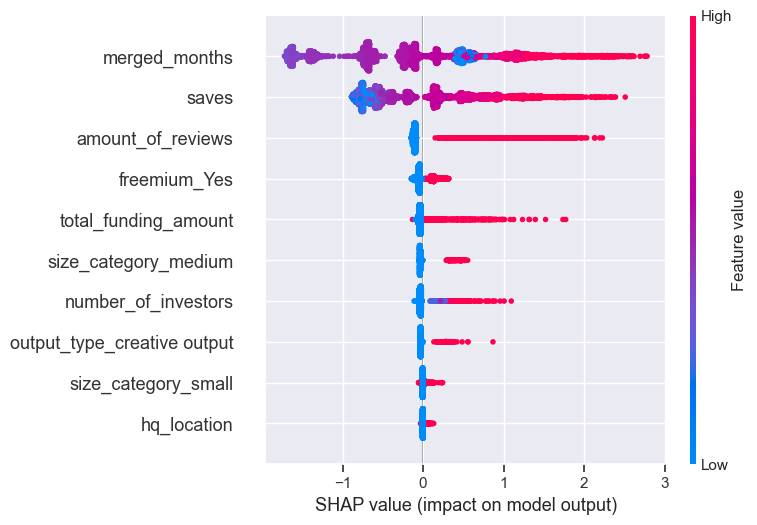

In [2053]:
shap.summary_plot(shap_values, X_train2)

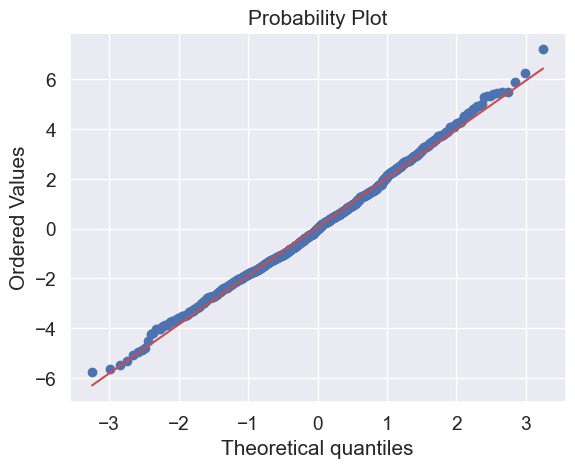

In [2054]:
# QQ plot
from scipy import stats
stats.probplot(residuals, plot=plt)
plt.show()

Probability plot shows normal results

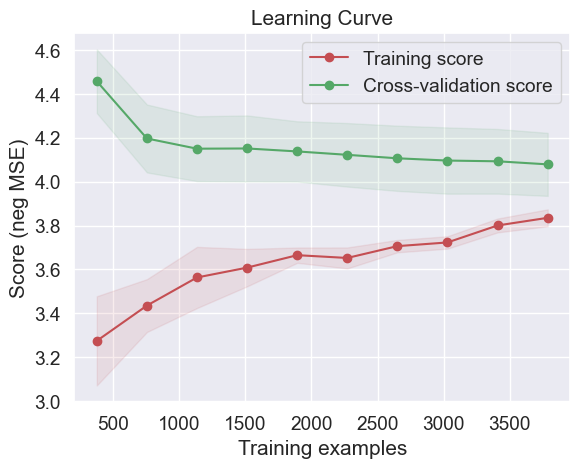

In [2055]:

# Bepaal de trainingsgroottes en ontvang de scores
train_sizes, train_scores, val_scores = learning_curve(xgb_model, X_train2, y_train2, cv=5, scoring='neg_mean_squared_error',
                                                       train_sizes=np.linspace(0.1, 1.0, 10))

# Bereken de gemiddelde en standaardafwijking van de trainings- en validatiescores
train_scores_mean = -train_scores.mean(axis=1)
train_scores_std = train_scores.std(axis=1)
val_scores_mean = -val_scores.mean(axis=1)
val_scores_std = val_scores.std(axis=1)

# Plot de learning curve
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, val_scores_mean - val_scores_std,
                 val_scores_mean + val_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, val_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.title("Learning Curve")
plt.xlabel("Training examples")
plt.ylabel("Score (neg MSE)")
plt.legend(loc="best")
plt.show()

Neg  MSE  flattens out after around 3500 trainings examples

## XGB Model 2

In [2060]:
#c use one hot encoding
d = pd.get_dummies(c)

In [2061]:
d.columns

Index(['price', 'funding_stage', 'months_since_founded', 'months_since_period',
       'average_visits', 'merged_months', 'hq_location', 'saves', 'likes',
       'stars', 'number_of_founders', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews', 'collaboration_sent', 'innovative_sent',
       'information_sent', 'service_sent', 'business_development_sent',
       'content_management_sent', 'user_experience_sent', 'design_sent',
       'time_management_sent', 'product_sent', 'content_creation_sent',
       'customer_support_sent', 'ease_of_use_sent',
       'workflow_optimization_sent', 'ai_assistant_sent', 'collaboration',
       'innovative', 'information', 'service', 'business_development',
       'content_management', 'user_experience', 'design', 'time_management',
       'product', 'content_creation', 'customer_support', 'ease_of_use',
       'workflow_optimization', 'ai_assistant', 'founders_imputed',
     

In [2063]:
features = [ 
      'merged_months',  'saves', 'likes',
       'stars', 'number_of_founders', 'number_of_investors',
       'number_of_funding_rounds', 'total_funding_amount', 'all_time_score',
       'amount_of_reviews',
       
        'customer_support',
       'freemium_Yes', 
  
     'size_category_medium', 'size_category_small'
       , 'output_type_technical output',
       'output_type_creative output']


target = d['average_visits']

# Split the data into train and test sets
X =  d[features]
y =  target


#### Hyperparameter tuning

In [2064]:

X_train = d[features]
y_train = target


# XGBoost Model Training
## XGBoost is an efficient and scalable implementation of gradient boosting that can be used for regression and classification problems.
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror') # Add your parameters here

# Hyperparameter Tuning (optional)
## Define a parameter grid to search for the best parameters for XGBoost
param_grid = {
    'max_depth': [3, 4, 5, 6],
    'n_estimators': [ 200, 400, 600],
    'learning_rate': [0.01, 0.1, 0.2],
    'gamma': [0, 0.1, 0.2],
    'min_child_weight': [1, 2, 3],
    'subsample': [0.6, 0.8],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'reg_lambda': [0, 2],
    'reg_alpha': [0, 0.2]
}


grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, cv=2, n_jobs=8, verbose=2)
grid_search.fit(X_train, y_train)

#print parameters
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)
print("Best estimator: ", grid_search.best_estimator_)
print("Best index: ", grid_search.best_index_) 
print("Refit time: ", grid_search.refit_time_)


Fitting 2 folds for each of 7776 candidates, totalling 15552 fits


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=0, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=200, reg_alpha=0, reg_lambda=2, su

#### Model building (class instance for reproducibility and scalability)

Code for the model to a class is modified using Github Copilot (2024)

In [2066]:
class AIModelEvaluator:
    def __init__(self, X, y, test_size=0.1, random_state=42, model_params=None):
        self.X = X
        self.y = y
        self.test_size = test_size
        self.random_state = random_state
        self.model_params = model_params if model_params else {}
        self.model = None
        self.dummy_regressor = None
        self.X_train = None
        self.X_test = None
        self.y_train = None
        self.y_test = None
        self.y_pred_train = None
        self.y_pred_test = None

    def split_data(self):
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.X, self.y, test_size=self.test_size, random_state=self.random_state)
    
    def train_model(self):
        self.model = XGBRegressor(random_state=self.random_state, **self.model_params)
        self.model.fit(self.X_train, self.y_train)


    def train_dummy(self):
        self.dummy_regressor = DummyRegressor(strategy='mean')
        self.dummy_regressor.fit(self.X_train, self.y_train)

    def predict(self):
        self.y_pred_train = self.model.predict(self.X_train)
        self.y_pred_test = self.model.predict(self.X_test)

    def evaluate_model(self):
        mse_train = mean_squared_error(self.y_train, self.y_pred_train)
        r2_train = r2_score(self.y_train, self.y_pred_train)
        mae_train = mean_absolute_error(self.y_train, self.y_pred_train)
        rmse_train = np.sqrt(mse_train)

        mse_test = mean_squared_error(self.y_test, self.y_pred_test)
        r2_test = r2_score(self.y_test, self.y_pred_test)
        mae_test = mean_absolute_error(self.y_test, self.y_pred_test)
        rmse_test = np.sqrt(mse_test)

        mape_train = np.mean(np.abs((self.y_train - self.y_pred_train) / self.y_train)) * 100
        mape_test = np.mean(np.abs((self.y_test - self.y_pred_test) / self.y_test)) * 100

        y_dummy_pred = self.dummy_regressor.predict(self.X_test)
        mse_dummy = mean_squared_error(self.y_test, y_dummy_pred)

        print(f"Training Set RMSE: {rmse_train}")
        print(f"Test Set RMSE: {rmse_test}")
        print(f"Training Set MAPE: {mape_train}")
        print(f"Test Set MAPE: {mape_test}")
        print(f"Training Set Mean Squared Error: {mse_train}")
        print(f"Test Set Mean Squared Error: {mse_test}")
        print(f"Baseline Model Mean Squared Error: {mse_dummy}")
        print(f"Training Set R^2 Score: {r2_train}")
        print(f"Test Set R^2 Score: {r2_test}")
        print(f"Training Set Mean Absolute Error: {mae_train}")
        print(f"Test Set Mean Absolute Error: {mae_test}")
        
        cv_scores = cross_val_score(self.model, self.X_train, self.y_train, cv=5, scoring='neg_mean_squared_error')
        print(f"Cross-validation scores (neg MSE): {cv_scores}")
        print(f"Gemiddelde Cross-validation score (MSE): {-np.mean(cv_scores)}")

        return {
            'mse_train': mse_train, 'mse_test': mse_test, 'r2_train': r2_train, 'r2_test': r2_test,
            'mae_train': mae_train, 'mae_test': mae_test, 'mse_dummy': mse_dummy, 'rmse_train': rmse_train,
            'rmse_test': rmse_test, 'mape_train': mape_train, 'mape_test': mape_test
        }

    def plot_residuals(self):
        residuals = self.y_test - self.y_pred_test
        plt.figure(figsize=(10,6))
        plt.scatter(self.y_pred_test, residuals)
        plt.axhline(y=0, color='r', linestyle='-')
        plt.xlabel('Predicted Values') 
        plt.ylabel('Residuals')
        plt.title('Residual plot')
        plt.show()

    def plot_feature_importance(self):
        feature_importance = self.model.feature_importances_
        features = self.X_train.columns

        plt.figure(figsize=(12, 8))
        plt.bar(range(len(feature_importance)), feature_importance, tick_label=features)
        plt.xticks(rotation='vertical')
        plt.xlabel('Features')
        plt.ylabel('Importance')
        plt.title('Feature Importance')
        plt.tight_layout()
        plt.show()
    
    def df_feature_importance(self):
        feature_importances = self.model.feature_importances_
        features = self.X_train.columns
        df_feature_importances = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
        df_feature_importances = df_feature_importances.sort_values(by='Importance', ascending=False).reset_index(drop=True)
        
        # Print the feature importances in a table format
        print(df_feature_importances)


    def compute_shap_values(self, X):
        # Initialize the Tree Explainer
        explainer = shap.TreeExplainer(self.model)

        # Compute SHAP values
        shap_values = explainer.shap_values(X)

        return explainer, shap_values

    def visualize_single_prediction_shap(self, explainer, shap_values, instance_index=0):
        # Visualize the SHAP values for a single prediction
        shap.initjs()  # Initialize JavaScript visualization in Jupyter Notebook/Lab
        return shap.force_plot(explainer.expected_value, shap_values[instance_index, :], self.X_train.iloc[instance_index, :])

    def visualize_summary_shap(self, shap_values, X):
        # Visualize the summary plot for SHAP values
        shap.summary_plot(shap_values, X)


  

    def decision_plot(self, shap_values, X, feature_display_range):
        shap.decision_plot(shap_values, X,  feature_display_range=feature_display_range)


Training Set RMSE: 1.9011232704260004
Test Set RMSE: 2.0390434128586756
Training Set MAPE: 21.558569514897492
Test Set MAPE: 22.749807751953284
Training Set Mean Squared Error: 3.6142696893552513
Test Set Mean Squared Error: 4.157698039522355
Baseline Model Mean Squared Error: 6.679899101709174
Training Set R^2 Score: 0.4529081473248653
Test Set R^2 Score: 0.3775806910185445
Training Set Mean Absolute Error: 1.5163602840065207
Test Set Mean Absolute Error: 1.6286561261861816
Cross-validation scores (neg MSE): [-3.81033611 -3.85562557 -4.09963664 -4.01614802 -3.76664477]
Gemiddelde Cross-validation score (MSE): 3.909678221673107


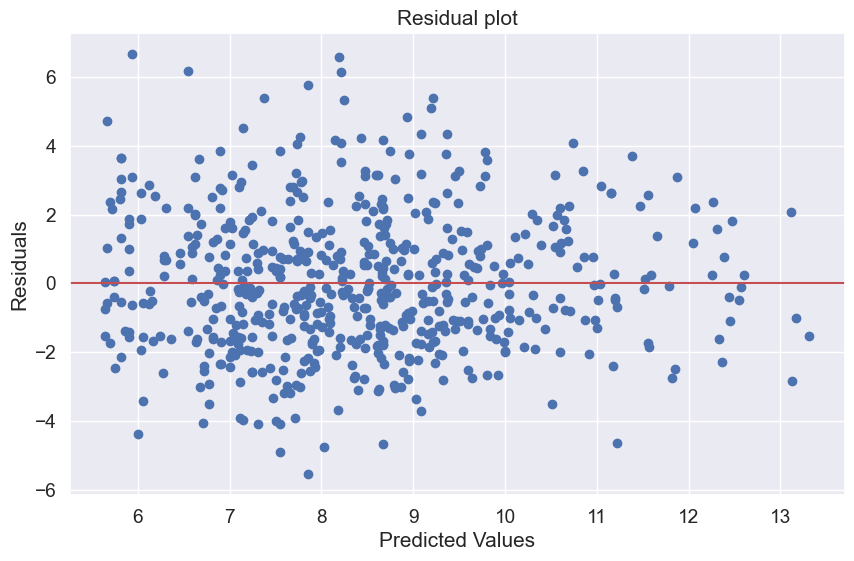

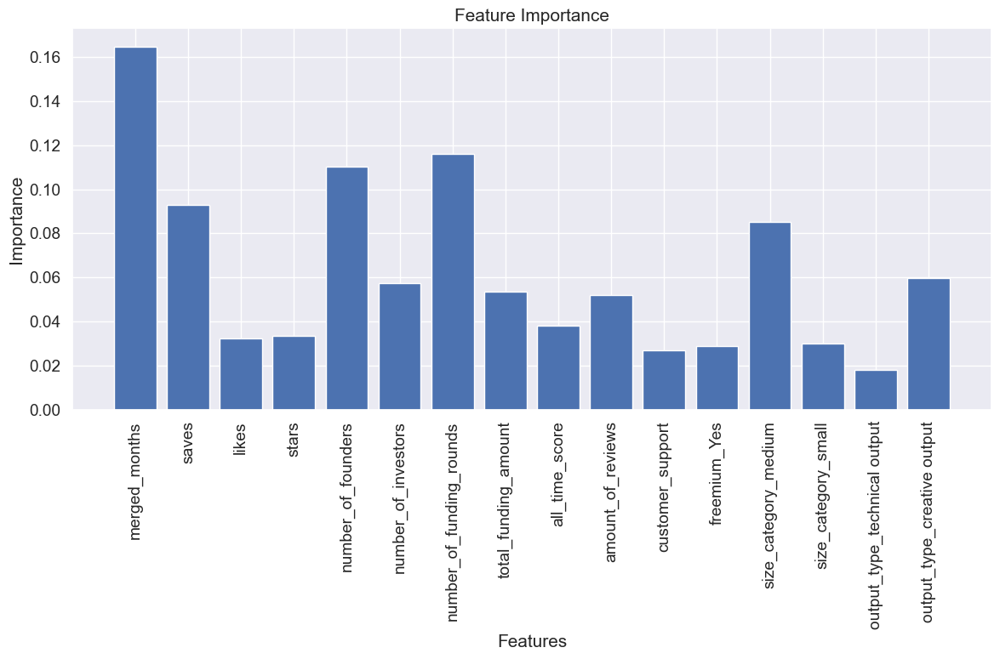

In [2067]:
# Initialize the evaluator with hyperparameters
hyperparameters = {'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 600, 'reg_alpha': 0.2, 'reg_lambda': 2, 'subsample': 0.6}
evaluator = AIModelEvaluator(X, y, model_params=hyperparameters)

# Split data into training and test sets
evaluator.split_data()

# Train the XGBoost model
evaluator.train_model()

# Optional: Train a dummy model for baseline comparison
evaluator.train_dummy()

# Make predictions on the training and test sets
evaluator.predict()

# Evaluate the model's performance
metrics = evaluator.evaluate_model()

# Plot residuals to inspect for patterns
evaluator.plot_residuals()

# Plot feature importance to understand the impact of each feature
evaluator.plot_feature_importance()


residual plot shows no pattern in the predictions

unclosed file <_io.BufferedReader name='/var/folders/lz/910twyk903nb6sxfgz54bngc0000gn/T/tmpetcfg3gl/model.ubj'>


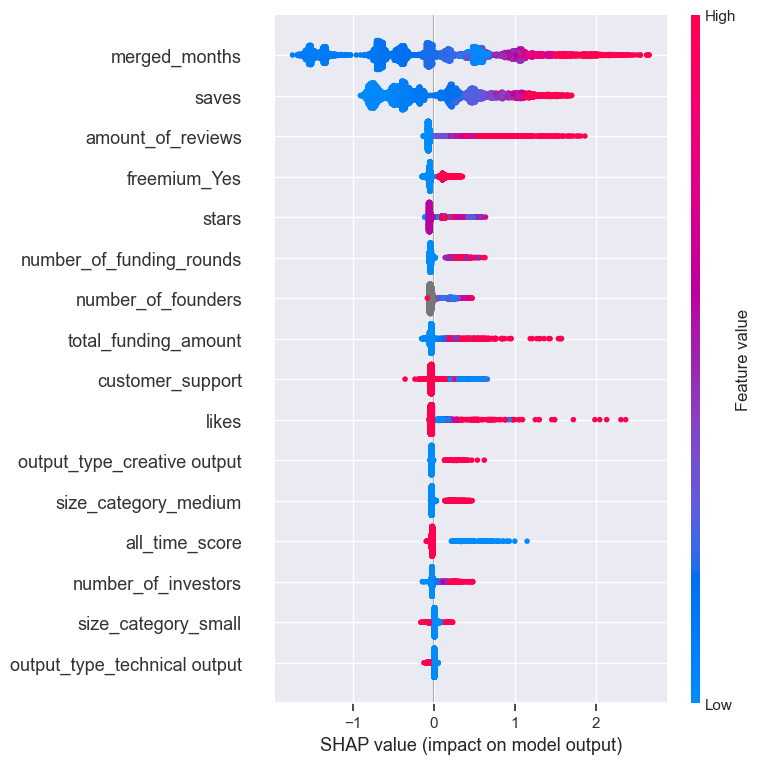

In [2068]:
# Assuming you have already initialized your evaluator and trained your model
evaluator = AIModelEvaluator(X, y, model_params=hyperparameters)
evaluator.split_data()
evaluator.train_model()

# Compute SHAP values (choose the appropriate dataset for SHAP value computation, here it's X_train)
explainer, shap_values = evaluator.compute_shap_values(evaluator.X_train)

# Visualize SHAP values for the first prediction
single_prediction_shap = evaluator.visualize_single_prediction_shap(explainer, shap_values)

# Visualize summary plot for SHAP values
evaluator.visualize_summary_shap(shap_values, evaluator.X_train)



# Conclusion


The comparison of the MLR and XGB has provided critical insights. The extreme gradient boosting models are superior in performance in terms of lower RMSE and MAE, and higher R-squared values.  This indicates its robustness and ability to generalize compared to MLR with the nature of the dataset used. The assumption heteroscedasticity was not met in the MLR model. When looking at Appendix 13 it can been see that this is not the case with the XGB M1, although it has the same dataset. XGB M2 is built from the features that were explained by their feature importance. Low importance predictors are deleted and high importance feature are kept, to avoid overfitting of the model.

All in all, while the MLR model offered initial insights, the XGB M1 and XGB M2 model's accommodation for the data's heteroscedastic nature and sparsity resulted in a more reliable and robust predictive framework, with XGB M2 being the best among many metrics.




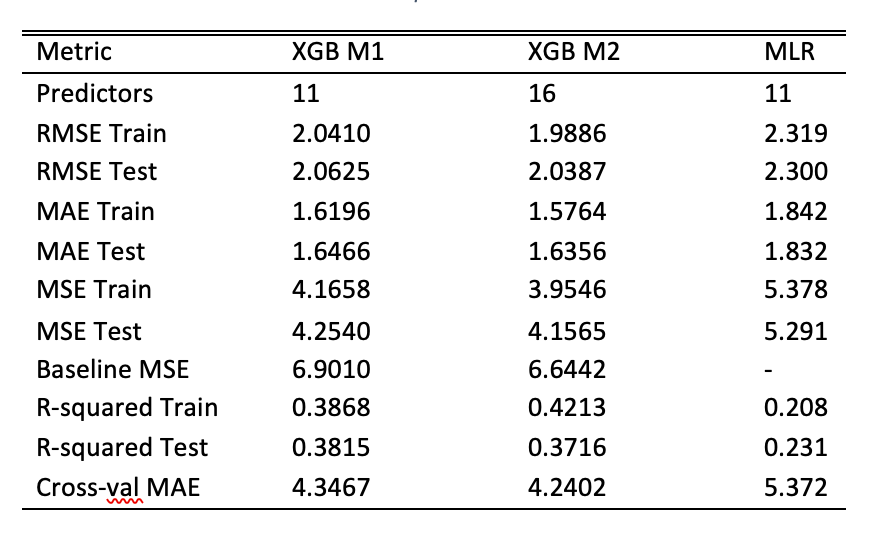

# References 

ChatGPT. (2024). https://chat.openai.com/

Github Copilot. (2024). 

Bhaumik, D & Dey, D (2023). BrightSpace. Linear-Logistic Regression.ipynb  from AI methods course

Developers XGB (2022). https://xgboost.readthedocs.io/en/stable/

Connor Tan (n.d.). Github. https://github.com/shap/shap

Scott Lundberg (2018). https://shap.readthedocs.io/en/latest/